In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as md
from datetime import datetime
from xml.etree import ElementTree

# Functions

In [2]:
def getData(location):
    train = ElementTree.parse(location)
    root = train.getroot()
    
    data_name = []
    for elem in root:
        data_name.append(elem.tag)
        
    xml_list = []
    title_list = []
    for elem in root:
        xml_sublist = []
        title_sublist = []
        for subelem in elem:
            value = [subelem.get(attrib) for attrib in subelem.keys()]
            xml_sublist.append(value)
            title_sublist.append(subelem.keys())
        xml_list.append(xml_sublist)
        title_list.append(title_sublist)
        
    title = []
    for i in range(len(title_list)):
        if len(title_list[i]) == 0:
            title.append('None')
        else:
            title.append(title_list[i][0])
        
    del title_list
    
    for i in range(len(title)):
        if len(xml_list[i]) == 0:
            continue
        else:
            df = pd.DataFrame(xml_list[i])
            df.columns = title[i]
            df.to_csv('data/591_testing/data_' + str(data_name[i]) + '.csv')

In [ ]:
getData('E:/master/thesis/data/OhioT1DM-full-access/OhioT1DM-testing/591-ws-testing.xml')

In [3]:
def readData(location):
    df = pd.read_csv(location)
    df = df.drop('Unnamed: 0', axis=1)
    
    return df

In [4]:
# synchronize glucose, heart rate, skin temperature and gsr data

def dataSynchronize(data_frame, date_frame, time):
   
    # String -> Timestamp
    data_frame['ts'] = pd.to_datetime(data_frame['ts'], dayfirst=True)
    
    # remove data before time
    data_frame = data_frame[data_frame['ts'] >= time]
    
    value = []
    j = 0
    for i in range(len(date_frame)-1):
    
        while ((data_frame['ts'].iloc[j] < date_frame['time'].iloc[i])&(data_frame['ts'].iloc[j+1] < date_frame['time'].iloc[i])):
            j=j+1
        
        diff = (date_frame['time'].iloc[i] - data_frame['ts'].iloc[j]).total_seconds()
    
        if diff < 300 and diff >= 0:
            if data_frame['value'].iloc[j] == 0:
                value.append('NaN')
                j=j+1
            else:
                value.append(data_frame['value'].iloc[j])
                j=j+1
        
        else:
            value.append('NaN')
            
    return data_frame, value

In [5]:
# show all the feature values in one image

def showFeatures(data, patient_num, num):
    plt.figure(figsize=(15,8))
    plt.plot(data['time'], data['glucose_value'], 'b', label='glucose')
    plt.plot(data['time'], data['skin_temp_value'], 'r', label='skin temperature')
    if num == 1:
        plt.plot(data['time'], data['heart_rate_value'], 'y', label='heart rate')
    else:
        plt.plot(data['time'], data['acceleration_value'], 'y', label='acceleration')
    plt.plot(data['time'], data['gsr_value'], 'g', label='gsr')
    plt.title(patient_num)
    plt.xlabel("time")
    plt.ylabel("value")
    plt.legend()

    plt.show()

In [6]:
# find each consecutive periods without any missing values

def getLongestPeriod(data, feature):
    # get all missing values
    nonmiss = []
    for k, v in data[data[feature] != 'NaN'].groupby((data[feature] == 'NaN').cumsum()):
        nonmiss.append(v['time'].tolist())
    
    starting_time = []
    ending_time = []
    duration = []
    for i in range(len(nonmiss)):
        starting_time.append(nonmiss[i][0])
        ending_time.append(nonmiss[i][-1])
        duration.append(len(nonmiss[i]))
        
    df_nonmiss = pd.DataFrame(list(zip(starting_time, ending_time, duration)), columns = ['start', 'end', 'duration'])
    
    return df_nonmiss

In [7]:
# find each consecutive missing periods

def getMissing(data, feature):
    miss = []
    for k, v in data[data[feature] == 'NaN'].groupby((data[feature] != 'NaN').cumsum()):
        miss.append(v['time'].tolist())
    
    starting_time = []
    ending_time = []
    duration = []
    for i in range(len(miss)):
        starting_time.append(miss[i][0])
        ending_time.append(miss[i][-1])
        duration.append(len(miss[i]))
        
    df_miss = pd.DataFrame(list(zip(starting_time, ending_time, duration)), columns = ['start', 'end', 'duration'])
    
    return df_miss

In [8]:
# find each consecutive periods with short missing values

def getLongest(nonmiss, miss, short):
    consecutive = ranges(short.index)
    #print(consecutive)
    
    duration_new = []
    starting_time_new = []
    ending_time_new = []

    for i in range(len(consecutive)):
        sub_duration = 0
        consecutive[i] = [v for v in range(consecutive[i][0], consecutive[i][-1]+1)]
        #print(consecutive[i])
 
        for j in range(len(consecutive[i])):

            if j == 0:
                sub_duration = sub_duration + nonmiss['duration'][consecutive[i][j]] + nonmiss['duration'][consecutive[i][j]+1]
            else:
                sub_duration = sub_duration + nonmiss['duration'][consecutive[i][j]+1]

        duration_new.append(sub_duration)
        starting_time_new.append(nonmiss['start'][consecutive[i][0]])
        ending_time_new.append(miss['end'][consecutive[i][-1]])
        
    new = pd.DataFrame(list(zip(starting_time_new, ending_time_new, duration_new)), columns = ['start', 'end', 'duration'])
    
    consecutive_new = []
    for i in range(len(consecutive)):
        consecutive[i] = list(set(consecutive[i]))
        #consecutive[i] = [v for v in range(consecutive[i][0], consecutive[i][-1]+2)]
        consecutive[i].append(consecutive[i][-1]+1)
        consecutive_new = consecutive_new + consecutive[i]
    
    df_final = nonmiss.drop(consecutive_new)
    
    df_final_final = pd.concat([df_final, new])
    df_final_final = df_final_final.sort_values(by='start')
    df_final_final = df_final_final.reset_index(drop=True)

    return df_final_final

In [9]:
def interpolation(data, num):
    df_nonmiss_glucose = data['glucose_value'].astype(float).interpolate()
    df_nonmiss_skin = data['skin_temp_value'].astype(float).interpolate()
    df_nonmiss_gsr = data['gsr_value'].astype(float).interpolate()
    if num == 1:
        df_nonmiss_heart = data['heart_rate_value'].astype(float).interpolate()
        df_nonmiss = pd.DataFrame(list(zip(data['time'], df_nonmiss_glucose, df_nonmiss_skin, df_nonmiss_heart, df_nonmiss_gsr)), columns=['time', 'glucose_value', 'skin_temp_value', 'heart_rate_value', 'gsr_value'])
    else:
        df_nonmiss_acceleration = data['acceleration_value'].astype(float).interpolate()
        df_nonmiss = pd.DataFrame(list(zip(data['time'], df_nonmiss_glucose, df_nonmiss_skin, df_nonmiss_acceleration, df_nonmiss_gsr)), columns=['time', 'glucose_value', 'skin_temp_value', 'acceleration_value', 'gsr_value'])

    return df_nonmiss

In [11]:
data=[1,2,3,4,5]
data[1:4]

[2, 3, 4]

In [9]:
def showMissing(data, feature_data, data_nonmiss, feature):
    miss_index = []
    for k, v in data[data[feature] == 'NaN'].groupby((data[feature] != 'NaN').cumsum()):
        miss_index.append(v.index.tolist()) 

    miss_value = []
    miss_time = []
    for i in range(len(miss_index)):
        miss_value.append(data_nonmiss[feature][miss_index[i][0] : miss_index[i][-1]+1])
        miss_time.append(data_nonmiss['time'][miss_index[i][0] : miss_index[i][-1]+1])
        
    plt.figure(figsize=(60,6))
    plt.plot(data['time'], data[feature])
    for i in range(len(miss_value)):
        plt.plot(list(miss_time[i]), list(miss_value[i]), c='red')
    plt.title(feature)
    plt.xlabel("time")
    plt.ylabel(feature)

    plt.show()

In [81]:
#def missingFeature(value):
#    missing = []
#    for i in range(len(value)):
#        if value[i] == 'NaN':
#            missing.append(0)
#        else:
#            missing.append(1)
            
#   return missing

# 559

combine training and test sets

In [10]:
df_glucose_training_559 =  readData('data/training_1/559_training/data_glucose_level.csv')
df_glucose_training_559.tail()

,ts,value
10791,17-01-2022 23:36:00,161
10792,17-01-2022 23:41:00,164
10793,17-01-2022 23:46:00,168
10794,17-01-2022 23:51:00,172
10795,17-01-2022 23:56:00,176


In [11]:
df_glucose_test_559 = readData('data/testing_1/559_testing/data_glucose_level.csv')

In [12]:
df_glucose_all_559 = pd.concat([df_glucose_training_559, df_glucose_test_559])
df_glucose_all_559 = df_glucose_all_559.reset_index(drop=True)

In [13]:
df_glucose_all_559

,ts,value
0,07-12-2021 01:17:00,101
1,07-12-2021 01:22:00,98
2,07-12-2021 01:27:00,104
3,07-12-2021 01:32:00,112
4,07-12-2021 01:37:00,120
...,...,...
13305,27-01-2022 23:18:00,185
13306,27-01-2022 23:23:00,183
13307,27-01-2022 23:28:00,182
13308,27-01-2022 23:33:00,180


In [14]:
df_glucose_all_559.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13310 entries, 0 to 13309
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   ts      13310 non-null  object
 1   value   13310 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 208.1+ KB


In [15]:
print('The glucose data is recorded from {}'.format(df_glucose_all_559['ts'][0]))
print('The glucose data ends at {}'.format(df_glucose_all_559['ts'].iloc[-1]))

The glucose data is recorded from 07-12-2021 01:17:00
The glucose data ends at 27-01-2022 23:38:00


In [16]:
df_skin_training_559 =  readData('data/training_1/559_training/data_basis_skin_temperature.csv')
df_skin_test_559 = readData('data/testing_1/559_testing/data_basis_skin_temperature.csv')
df_skin_all_559 = pd.concat([df_skin_training_559, df_skin_test_559])
df_skin_all_559 = df_skin_all_559.reset_index(drop=True)

In [17]:
df_skin_all_559.tail()

,ts,value
14514,27-01-2022 17:10:00,83.30
14515,27-01-2022 17:15:00,84.88
14516,27-01-2022 17:41:00,85.82
14517,27-01-2022 17:46:00,86.36
14518,27-01-2022 17:51:00,80.96


In [18]:
print('The skin temporature data is recorded from {}'.format(df_skin_all_559['ts'][0]))
print('The skin temporature data ends at {}'.format(df_skin_all_559['ts'].iloc[-1]))

The skin temporature data is recorded from 07-12-2021 12:59:00
The skin temporature data ends at 27-01-2022 17:51:00


In [19]:
df_heart_training_559 =  readData('data/training_1/559_training/data_basis_heart_rate.csv')
df_heart_test_559 = readData('data/testing_1/559_testing/data_basis_heart_rate.csv')
df_heart_all_559 = pd.concat([df_heart_training_559, df_heart_test_559])
df_heart_all_559 = df_heart_all_559.reset_index(drop=True)

In [20]:
df_heart_all_559.tail()

,ts,value
14607,27-01-2022 17:24:00,140
14608,27-01-2022 17:40:00,75
14609,27-01-2022 17:45:00,80
14610,27-01-2022 17:50:00,118
14611,27-01-2022 17:55:00,150


In [21]:
print('The heart rate data is recorded from {}'.format(df_heart_all_559['ts'][0]))
print('The heart rate data ends at {}'.format(df_heart_all_559['ts'].iloc[-1]))

The heart rate data is recorded from 07-12-2021 12:57:00
The heart rate data ends at 27-01-2022 17:55:00


In [22]:
df_gsr_training_559 =  readData('data/training_1/559_training/data_basis_gsr.csv')
df_gsr_test_559 = readData('data/testing_1/559_testing/data_basis_gsr.csv')
df_gsr_all_559 = pd.concat([df_gsr_training_559, df_gsr_test_559])
df_gsr_all_559 = df_gsr_all_559.reset_index(drop=True)

In [23]:
df_gsr_all_559.tail()

,ts,value
14433,27-01-2022 17:12:00,0.000074
14434,27-01-2022 17:17:00,0.000073
14435,27-01-2022 17:41:00,0.000074
14436,27-01-2022 17:46:00,0.000075
14437,27-01-2022 17:51:00,0.000071


In [24]:
print('The gsr data is recorded from {}'.format(df_gsr_all_559['ts'][0]))
print('The gsr data ends at {}'.format(df_gsr_all_559['ts'].iloc[-1]))

The gsr data is recorded from 07-12-2021 12:59:00
The gsr data ends at 27-01-2022 17:51:00


# Data processing

In [25]:
# generate a dataframe where each data point has 5 mins difference, the missing values are represented by NaN

date_new_559 = pd.date_range(start=datetime(2021, 12, 8, hour=0, minute=4), end=datetime(2022, 1, 27, hour=17, minute=55), freq='5min')
df_date_new_559 = pd.DataFrame(date_new_559, columns=['time'])

In [26]:
date_new_559

DatetimeIndex(['2021-12-08 00:04:00', '2021-12-08 00:09:00',
               '2021-12-08 00:14:00', '2021-12-08 00:19:00',
               '2021-12-08 00:24:00', '2021-12-08 00:29:00',
               '2021-12-08 00:34:00', '2021-12-08 00:39:00',
               '2021-12-08 00:44:00', '2021-12-08 00:49:00',
               ...
               '2022-01-27 17:09:00', '2022-01-27 17:14:00',
               '2022-01-27 17:19:00', '2022-01-27 17:24:00',
               '2022-01-27 17:29:00', '2022-01-27 17:34:00',
               '2022-01-27 17:39:00', '2022-01-27 17:44:00',
               '2022-01-27 17:49:00', '2022-01-27 17:54:00'],
              dtype='datetime64[ns]', length=14615, freq='5T')

In [27]:
df_glucose_559, glucose_value = dataSynchronize(df_glucose_all_559, df_date_new_559, '2021-12-08 00:00:00')
df_heart_559, heart_value = dataSynchronize(df_heart_all_559, df_date_new_559, '2021-12-08 00:00:00')
df_skin_559, skin_value = dataSynchronize(df_skin_all_559, df_date_new_559, '2021-12-08 00:00:00')
df_gsr_559, gsr_value = dataSynchronize(df_gsr_all_559, df_date_new_559, '2021-12-08 00:00:00')

In [95]:
#glucose_missing = missingFeature(glucose_value)
#skin_temp_missing = missingFeature(skin_value)
#heart_rate_missing = missingFeature(heart_value)
#gsr_missing = missingFeature(gsr_value)

In [28]:
df_559 = pd.DataFrame(list(zip(date_new_559, glucose_value, skin_value, heart_value, gsr_value)), columns=['time', 'glucose_value', 'skin_temp_value', 'heart_rate_value', 'gsr_value'])
df_559

,time,glucose_value,skin_temp_value,heart_rate_value,gsr_value
0,2021-12-08 00:04:00,343,89.6,61,0.000086
1,2021-12-08 00:09:00,346,89.6,62,0.000089
2,2021-12-08 00:14:00,346,90.14,63,0.000089
3,2021-12-08 00:19:00,344,90.68,63,0.000096
4,2021-12-08 00:24:00,340,92.48,69,0.000137
...,...,...,...,...,...
14609,2022-01-27 17:29:00,131,NaN,NaN,NaN
14610,2022-01-27 17:34:00,135,NaN,NaN,NaN
14611,2022-01-27 17:39:00,140,NaN,NaN,NaN
14612,2022-01-27 17:44:00,144,85.82,75,0.000074


In [97]:
df_559.to_csv('data/559.csv')

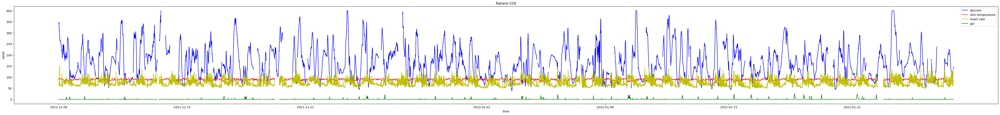

In [774]:
showFeatures(df_559, 'Patient 559', 1)

In [31]:
glucose_559 = pd.DataFrame(list(zip(date_new_559, glucose_value)), columns=['time', 'glucose_value'])
skin_559 = pd.DataFrame(list(zip(date_new_559, skin_value)), columns=['time', 'skin_temp_value'])
heart_559 = pd.DataFrame(list(zip(date_new_559, heart_value)), columns=['time', 'heart_rate_value'])
gsr_559 = pd.DataFrame(list(zip(date_new_559, gsr_value)), columns=['time', 'gsr_value'])

In [148]:
heart_559 = pd.DataFrame(list(zip(date_new_559, heart_value)), columns=['time', 'heart_rate_value'])
df_heart_nonmiss_559 = getLongestPeriod(heart_559, 'heart_rate_value')
max(df_heart_nonmiss_559['duration'])

388

In [29]:
df_glucose_all_559['ts'] = pd.to_datetime(df_glucose_all_559['ts'], dayfirst=True)
df_559_longest = df_glucose_all_559[df_glucose_all_559['ts'].between('2021-12-27 19:14:00', '2022-01-01 06:44:00')]
df_559_longest = df_559_longest.reset_index(drop=True)

In [30]:
df_559_longest.to_csv('mutivariate/data/559_12.27_1290.csv', index=False)

In [150]:
df_glucose_nonmiss_559 = getLongestPeriod(glucose_559, 'glucose_value')
df_glucose_nonmiss_559[df_glucose_nonmiss_559['duration'] == 1291]

,start,end,duration
22,2021-12-27 19:14:00,2022-01-01 06:44:00,1291


In [673]:
print('The longest period without any missing period is {}'.format(max(df_glucose_nonmiss_559['duration'])))

The longest period without any missing period is 1291


In [949]:
df_glucose_miss_559 = getMissing(glucose_559, 'glucose_value')
short_glucose_559 = df_glucose_miss_559[df_glucose_miss_559['duration'] < 24]

In [950]:
max(df_glucose_miss_559['duration'])

156

In [682]:
df_consecutive_559 = getLongest(df_glucose_nonmiss_559, df_glucose_miss_559, short_glucose_559)

In [683]:
print('The longest period with short missing period is {}'.format(max(df_consecutive_559['duration'])))

The longest period with short missing period is 1581


In [948]:
df_gsr_miss_559 = getMissing(gsr_559, 'gsr_value')
print('The number of missing values in gsr is {}'.format(len(df_gsr_miss_559)))
print('The number of missing values longer than 2 hours in gsr is {}'.format(len(df_gsr_miss_559[df_gsr_miss_559['duration'] > 24])))
print('The longest missing period in gsr is {}'.format(max(df_gsr_miss_559['duration'])))

The number of missing values in gsr is 175
The number of missing values longer than 2 hours in gsr is 4
The longest missing period in gsr is 96


[Text(0.5, 0, 'Starting Date'), Text(0, 0.5, 'Duration')]

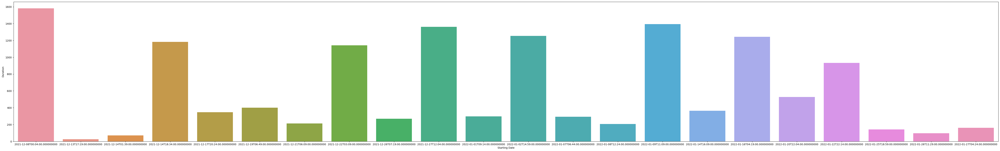

In [1040]:
ax = sns.barplot(x=df_consecutive_559['start'], y=df_consecutive_559['duration'])

ax.figure.set_size_inches(70,10)
#ax.xaxis.set_major_formatter(DateFormatter("%y-%m-%d"))
ax.set(xlabel="Starting Date", ylabel="Duration")

In [994]:
df_nonmiss_559 = interpolation(df_559, 1)

In [1032]:
df_nonmiss_559.to_csv('data/nonmiss_559.csv')

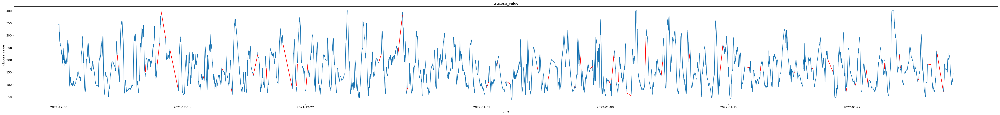

In [1071]:
showMissing(df_559, glucose_559, df_nonmiss_559, 'glucose_value')

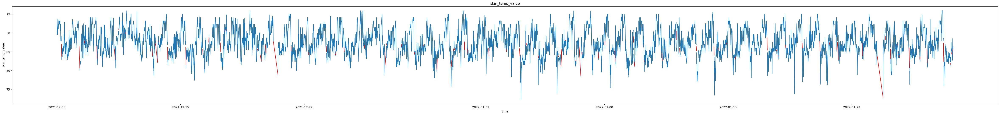

In [1072]:
showMissing(df_559, skin_559, df_nonmiss_559, 'skin_temp_value')

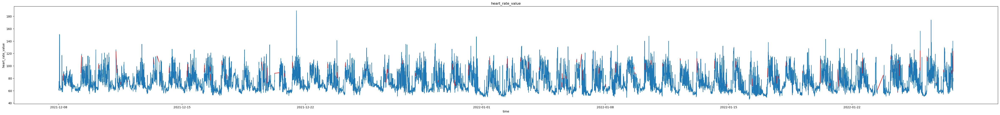

In [1073]:
showMissing(df_559, heart_559, df_nonmiss_559, 'heart_rate_value')

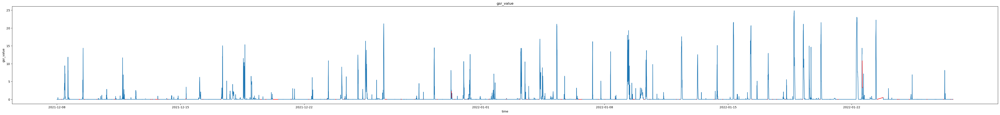

In [1074]:
showMissing(df_559, gsr_559, df_nonmiss_559, 'gsr_value')

# 563

In [17]:
df_glucose_training_563 =  readData('data/training_1/563_training/data_glucose_level.csv')
df_glucose_test_563 =  readData('data/testing_1/563_testing/data_glucose_level.csv')
df_glucose_all_563 = pd.concat([df_glucose_training_563, df_glucose_test_563])
df_glucose_all_563 = df_glucose_all_563.reset_index(drop=True)

In [18]:
print('The glucose data is recorded from {}'.format(df_glucose_all_563['ts'][0]))
print('The glucose data ends at {}'.format(df_glucose_all_563['ts'].iloc[-1]))

The glucose data is recorded from 13-09-2021 12:33:00
The glucose data ends at 07-11-2021 08:13:00


In [19]:
df_glucose_all_563['ts'] = pd.to_datetime(df_glucose_all_563['ts'], dayfirst=True)
df_563_longest = df_glucose_all_563[df_glucose_all_563['ts'].between('2021-10-15 11:20:00', '2021-10-21 11:05:00')]
df_563_longest = df_563_longest.reset_index(drop=True)
#df_563_longest = df_563_longest.drop(['ts'], axis=1)

In [21]:
df_563_longest.to_csv('mutivariate/563_10.15_1726.csv', index=False)

In [14]:
df_skin_training_563 =  readData('data/training_1/563_training/data_basis_skin_temperature.csv')
df_skin_test_563 = readData('data/testing_1/563_testing/data_basis_skin_temperature.csv')
df_skin_all_563 = pd.concat([df_skin_training_563, df_skin_test_563])
df_skin_all_563 = df_skin_all_563.reset_index(drop=True)

In [105]:
print('The skin temporature data is recorded from {}'.format(df_skin_all_563['ts'][0]))
print('The skin temporature data ends at {}'.format(df_skin_all_563['ts'].iloc[-1]))

The skin temporature data is recorded from 17-09-2021 09:30:00
The skin temporature data ends at 07-11-2021 23:57:00


In [106]:
df_heart_training_563 =  readData('data/training_1/563_training/data_basis_heart_rate.csv')
df_heart_test_563 = readData('data/testing_1/563_testing/data_basis_heart_rate.csv')
df_heart_all_563 = pd.concat([df_heart_training_563, df_heart_test_563])
df_heart_all_563 = df_heart_all_563.reset_index(drop=True)

In [107]:
print('The heart rate data is recorded from {}'.format(df_heart_all_563['ts'][0]))
print('The heart rate data ends at {}'.format(df_heart_all_563['ts'].iloc[-1]))

The heart rate data is recorded from 17-09-2021 09:28:00
The heart rate data ends at 07-11-2021 23:56:00


In [108]:
df_gsr_training_563 =  readData('data/training_1/563_training/data_basis_gsr.csv')
df_gsr_test_563 = readData('data/testing_1/563_testing/data_basis_gsr.csv')
df_gsr_all_563 = pd.concat([df_gsr_training_563, df_gsr_test_563])
df_gsr_all_563 = df_gsr_all_563.reset_index(drop=True)

In [109]:
print('The gsr data is recorded from {}'.format(df_gsr_all_563['ts'][0]))
print('The gsr data ends at {}'.format(df_gsr_all_563['ts'].iloc[-1]))

The gsr data is recorded from 17-09-2021 09:30:00
The gsr data ends at 07-11-2021 23:57:00


In [110]:
date_new_563 = pd.date_range(start=datetime(2021, 9, 17, hour=9, minute=30), end=datetime(2021, 11, 7, hour=8, minute=13), freq='5min')
df_date_new_563 = pd.DataFrame(date_new_563, columns=['time'])

In [111]:
df_glucose_563, glucose_value_563 = dataSynchronize(df_glucose_all_563, df_date_new_563, '2021-9-17 09:28:00')
df_heart_563, heart_value_563 = dataSynchronize(df_heart_all_563, df_date_new_563, '2021-9-17 09:28:00')
df_skin_563, skin_value_563 = dataSynchronize(df_skin_all_563, df_date_new_563, '2021-9-17 09:28:00')
df_gsr_563, gsr_value_563 = dataSynchronize(df_gsr_all_563, df_date_new_563, '2021-9-17 09:28:00')

In [112]:
df_563 = pd.DataFrame(list(zip(date_new_563, glucose_value_563, skin_value_563, heart_value_563, gsr_value_563)), columns=['time', 'glucose_value', 'skin_temp_value', 'heart_rate_value', 'gsr_value'])
df_563

,time,glucose_value,skin_temp_value,heart_rate_value,gsr_value
0,2021-09-17 09:30:00,224,87.26,87,0.000056
1,2021-09-17 09:35:00,225,89.42,96,0.000056
2,2021-09-17 09:40:00,221,87.08,113,0.000055
3,2021-09-17 09:45:00,219,86.54,103,0.000054
4,2021-09-17 09:50:00,225,87.8,97,0.000055
...,...,...,...,...,...
14667,2021-11-07 07:45:00,145,87.26,78,0.03372
14668,2021-11-07 07:50:00,137,86.9,75,0.04068
14669,2021-11-07 07:55:00,136,86.9,77,0.04568
14670,2021-11-07 08:00:00,139,87.26,74,0.05188


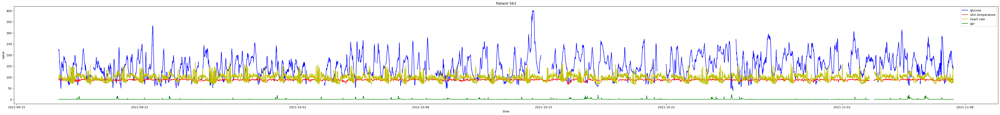

In [773]:
showFeatures(df_563, 'Patient 563', 1)

In [370]:
df_563.to_csv('data/563.csv')

In [44]:
glucose_563 = pd.DataFrame(list(zip(date_new_563, glucose_value_563)), columns=['time', 'glucose_value'])

In [113]:
heart_563 = pd.DataFrame(list(zip(date_new_563, heart_value_563)), columns=['time', 'heart_rate_value'])
df_heart_nonmiss_563 = getLongestPeriod(heart_563, 'heart_rate_value')
max(df_heart_nonmiss_563['duration'])

450

In [45]:
df_glucose_nonmiss_563 = getLongestPeriod(glucose_563, 'glucose_value')

In [46]:
print('The longest period without any missing period is {}'.format(max(df_glucose_nonmiss_563['duration'])))

The longest period without any missing period is 1726


In [945]:
df_glucose_miss_563 = getMissing(glucose_563, 'glucose_value')
short_glucose_563 = df_glucose_miss_563[df_glucose_miss_563['duration'] < 24]

In [946]:
max(df_glucose_miss_563['duration'])

288

In [685]:
df_consecutive_563 = getLongest(df_glucose_nonmiss_563, df_glucose_miss_563, short_glucose_563)

In [686]:
print('The longest period with short missing period is {}'.format(max(df_consecutive_563['duration'])))

The longest period with short missing period is 1726


In [942]:
gsr_563 = pd.DataFrame(list(zip(date_new_563, gsr_value_563)), columns=['time', 'gsr_value'])
df_gsr_miss_563 = getMissing(gsr_563, 'gsr_value')
print('The number of missing values in gsr is {}'.format(len(df_gsr_miss_563)))
print('The number of missing values longer than 2 hours in gsr is {}'.format(len(df_gsr_miss_563[df_gsr_miss_563['duration'] > 24])))
print('The longest missing period in gsr is {}'.format(max(df_gsr_miss_563['duration'])))

The number of missing values in gsr is 58
The number of missing values longer than 2 hours in gsr is 1
The longest missing period in gsr is 80


[Text(0.5, 0, 'Starting Date'), Text(0, 0.5, 'Duration')]

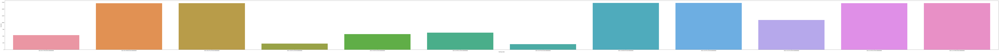

In [581]:
ax = sns.barplot(x=df_consecutive_563['start'], y=df_consecutive_563['duration'])

ax.figure.set_size_inches(200,10)
#ax.xaxis.set_major_formatter(DateFormatter("%y-%m-%d"))
ax.set(xlabel="Starting Date", ylabel="Duration")

In [1041]:
df_nonmiss_563 = interpolation(df_563, 1)
df_nonmiss_563.to_csv('data/nonmiss_563.csv')

# 570

In [31]:
df_glucose_training_570 =  readData('data/training_1/570_training/data_glucose_level.csv')
df_glucose_test_570 =  readData('data/testing_1/570_testing/data_glucose_level.csv')
df_glucose_all_570 = pd.concat([df_glucose_training_570, df_glucose_test_570])
df_glucose_all_570 = df_glucose_all_570.reset_index(drop=True)
print('The glucose data is recorded from {}'.format(df_glucose_all_570['ts'][0]))
print('The glucose data ends at {}'.format(df_glucose_all_570['ts'].iloc[-1]))

The glucose data is recorded from 07-12-2021 16:29:00
The glucose data ends at 26-01-2022 23:57:00


In [32]:
df_skin_training_570 =  readData('data/training_1/570_training/data_basis_skin_temperature.csv')
df_skin_test_570 = readData('data/testing_1/570_testing/data_basis_skin_temperature.csv')
df_skin_all_570 = pd.concat([df_skin_training_570, df_skin_test_570])
df_skin_all_570 = df_skin_all_570.reset_index(drop=True)
print('The skin temporature data is recorded from {}'.format(df_skin_all_570['ts'][0]))
print('The skin temporature data ends at {}'.format(df_skin_all_570['ts'].iloc[-1]))

The skin temporature data is recorded from 07-12-2021 14:55:00
The skin temporature data ends at 26-01-2022 17:59:00


In [33]:
df_heart_training_570 =  readData('data/training_1/570_training/data_basis_heart_rate.csv')
df_heart_test_570 = readData('data/testing_1/570_testing/data_basis_heart_rate.csv')
df_heart_all_570 = pd.concat([df_heart_training_570, df_heart_test_570])
df_heart_all_570 = df_heart_all_570.reset_index(drop=True)
print('The heart rate data is recorded from {}'.format(df_heart_all_570['ts'][0]))
print('The heart rate data ends at {}'.format(df_heart_all_570['ts'].iloc[-1]))

The heart rate data is recorded from 07-12-2021 14:51:00
The heart rate data ends at 26-01-2022 17:59:00


In [34]:
df_gsr_training_570 =  readData('data/training_1/570_training/data_basis_gsr.csv')
df_gsr_test_570 = readData('data/testing_1/570_testing/data_basis_gsr.csv')
df_gsr_all_570 = pd.concat([df_gsr_training_570, df_gsr_test_570])
df_gsr_all_570 = df_gsr_all_570.reset_index(drop=True)
print('The gsr data is recorded from {}'.format(df_gsr_all_570['ts'][0]))
print('The gsr data ends at {}'.format(df_gsr_all_570['ts'].iloc[-1]))

The gsr data is recorded from 07-12-2021 14:55:00
The gsr data ends at 26-01-2022 17:59:00


In [35]:
date_new_570 = pd.date_range(start=datetime(2021, 12, 8, hour=0, minute=4), end=datetime(2022, 1, 26, hour=17, minute=59), freq='5min')
df_date_new_570 = pd.DataFrame(date_new_570, columns=['time'])

In [36]:
df_glucose_570, glucose_value_570 = dataSynchronize(df_glucose_all_570, df_date_new_570, '2021-12-8 00:00:00')
df_heart_570, heart_value_570 = dataSynchronize(df_heart_all_570, df_date_new_570, '2021-12-8 00:00:00')
df_skin_570, skin_value_570 = dataSynchronize(df_skin_all_570, df_date_new_570, '2021-12-8 00:00:00')
df_gsr_570, gsr_value_570 = dataSynchronize(df_gsr_all_570, df_date_new_570, '2021-12-8 00:00:00')

In [37]:
df_570 = pd.DataFrame(list(zip(date_new_570, glucose_value_570, skin_value_570, heart_value_570, gsr_value_570)), columns=['time', 'glucose_value', 'skin_temp_value', 'heart_rate_value', 'gsr_value'])

In [11]:
df_570

,time,glucose_value,skin_temp_value,heart_rate_value,gsr_value
0,2021-12-08 00:04:00,125,85.1,63,0.000087
1,2021-12-08 00:09:00,124,85.1,63,0.000097
2,2021-12-08 00:14:00,125,85.1,62,0.000098
3,2021-12-08 00:19:00,125,85.1,62,0.000107
4,2021-12-08 00:24:00,121,85.1,62,0.000139
...,...,...,...,...,...
14322,2022-01-26 17:34:00,NaN,88.7,82,0.000053
14323,2022-01-26 17:39:00,160,88.7,83,0.000055
14324,2022-01-26 17:44:00,160,88.7,82,0.000051
14325,2022-01-26 17:49:00,161,88.34,83,0.00005


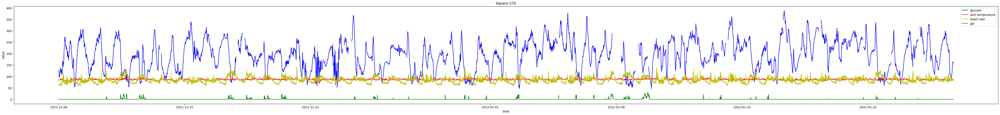

In [772]:
showFeatures(df_570, 'Patient 570', 1)

In [619]:
df_570.to_csv('data/570.csv')

In [122]:
heart_570 = pd.DataFrame(list(zip(date_new_570, heart_value_570)), columns=['time', 'heart_rate_value'])
df_heart_nonmiss_570 = getLongestPeriod(heart_570, 'heart_rate_value')
df_heart_nonmiss_570[df_heart_nonmiss_570['duration'] == 806]

,start,end,duration
2,2021-12-09 02:34:00,2021-12-11 21:39:00,806


In [60]:
df_glucose_all_570['ts'] = pd.to_datetime(df_glucose_all_570['ts'], dayfirst=True)
df_570_longest = df_glucose_all_570[df_glucose_all_570['ts'].between('2021-12-08 00:04:00', '2021-12-13 14:29:00')]
df_570_longest = df_570_longest.reset_index(drop=True)
df_570_longest.to_csv('mutivariate/data/570_12.8_1614.csv', index=False)

In [41]:
glucose_570 = pd.DataFrame(list(zip(date_new_570, glucose_value_570)), columns=['time', 'glucose_value'])
df_glucose_nonmiss_570 = getLongestPeriod(glucose_570, 'glucose_value')

In [42]:
df_glucose_nonmiss_570

,start,end,duration
0,2021-12-08 00:04:00,2021-12-13 14:29:00,1614
1,2021-12-13 17:09:00,2021-12-17 06:19:00,1023
2,2021-12-17 07:39:00,2021-12-17 20:44:00,158
3,2021-12-17 23:14:00,2021-12-18 04:59:00,70
4,2021-12-18 08:39:00,2021-12-19 07:34:00,276
5,2021-12-19 09:19:00,2021-12-22 17:04:00,958
6,2021-12-22 18:04:00,2021-12-22 20:19:00,28
7,2021-12-22 20:29:00,2021-12-23 18:34:00,266
8,2021-12-23 21:09:00,2021-12-24 02:54:00,70
9,2021-12-24 07:09:00,2021-12-27 07:54:00,874


In [941]:
glucose_570 = pd.DataFrame(list(zip(date_new_570, glucose_value_570)), columns=['time', 'glucose_value'])
df_glucose_nonmiss_570 = getLongestPeriod(glucose_570, 'glucose_value')
print('The longest period without any missing period is {}'.format(max(df_glucose_nonmiss_570['duration'])))
df_glucose_miss_570 = getMissing(glucose_570, 'glucose_value')
short_glucose_570 = df_glucose_miss_570[df_glucose_miss_570['duration'] < 24]
df_consecutive_570 = getLongest(df_glucose_nonmiss_570, df_glucose_miss_570, short_glucose_570)
print('The longest period with short missing period is {}'.format(max(df_consecutive_570['duration'])))

The longest period without any missing period is 1614
The longest period with short missing period is 1713


In [903]:
max(df_glucose_miss_570['duration'])

144

In [940]:
gsr_570 = pd.DataFrame(list(zip(date_new_570, gsr_value_570)), columns=['time', 'gsr_value'])
df_gsr_miss_570 = getMissing(gsr_570, 'gsr_value')
print('The number of missing values in gsr is {}'.format(len(df_gsr_miss_570)))
print('The number of missing values longer than 2 hours in gsr is {}'.format(len(df_gsr_miss_570[df_gsr_miss_570['duration'] > 24])))
print('The longest missing period in gsr is {}'.format(max(df_gsr_miss_570['duration'])))

The number of missing values in gsr is 87
The number of missing values longer than 2 hours in gsr is 0
The longest missing period in gsr is 15


[Text(0.5, 0, 'Starting Date'), Text(0, 0.5, 'Duration')]

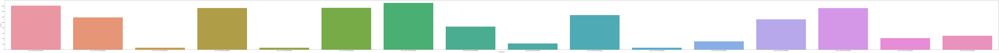

In [688]:
ax = sns.barplot(x=df_consecutive_570['start'], y=df_consecutive_570['duration'])

ax.figure.set_size_inches(200,10)
#ax.xaxis.set_major_formatter(DateFormatter("%y-%m-%d"))
ax.set(xlabel="Starting Date", ylabel="Duration")

In [1042]:
df_nonmiss_570 = interpolation(df_570, 1)
df_nonmiss_570.to_csv('data/nonmiss_570.csv')

# 575

In [40]:
df_glucose_training_575 =  readData('data/training_1/575_training/data_glucose_level.csv')
df_glucose_test_575 =  readData('data/testing_1/575_testing/data_glucose_level.csv')
df_glucose_all_575 = pd.concat([df_glucose_training_575, df_glucose_test_575])
df_glucose_all_575 = df_glucose_all_575.reset_index(drop=True)
print('The glucose data is recorded from {}'.format(df_glucose_all_575['ts'][0]))
print('The glucose data ends at {}'.format(df_glucose_all_575['ts'].iloc[-1]))

The glucose data is recorded from 17-11-2021 12:04:00
The glucose data ends at 11-01-2022 10:29:00


In [41]:
df_skin_training_575 =  readData('data/training_1/575_training/data_basis_skin_temperature.csv')
df_skin_test_575 = readData('data/testing_1/575_testing/data_basis_skin_temperature.csv')
df_skin_all_575 = pd.concat([df_skin_training_575, df_skin_test_575])
df_skin_all_575 = df_skin_all_575.reset_index(drop=True)
print('The skin temporature data is recorded from {}'.format(df_skin_all_575['ts'][0]))
print('The skin temporature data ends at {}'.format(df_skin_all_575['ts'].iloc[-1]))

The skin temporature data is recorded from 17-11-2021 11:27:00
The skin temporature data ends at 11-01-2022 13:46:00


In [42]:
df_heart_training_575 =  readData('data/training_1/575_training/data_basis_heart_rate.csv')
df_heart_test_575 = readData('data/testing_1/575_testing/data_basis_heart_rate.csv')
df_heart_all_575 = pd.concat([df_heart_training_575, df_heart_test_575])
df_heart_all_575 = df_heart_all_575.reset_index(drop=True)
print('The heart rate data is recorded from {}'.format(df_heart_all_575['ts'][0]))
print('The heart rate data ends at {}'.format(df_heart_all_575['ts'].iloc[-1]))

The heart rate data is recorded from 17-11-2021 11:25:00
The heart rate data ends at 11-01-2022 13:46:00


In [43]:
df_gsr_training_575 =  readData('data/training_1/575_training/data_basis_gsr.csv')
df_gsr_test_575 = readData('data/testing_1/575_testing/data_basis_gsr.csv')
df_gsr_all_575 = pd.concat([df_gsr_training_575, df_gsr_test_575])
df_gsr_all_575 = df_gsr_all_575.reset_index(drop=True)
print('The gsr data is recorded from {}'.format(df_gsr_all_575['ts'][0]))
print('The gsr data ends at {}'.format(df_gsr_all_575['ts'].iloc[-1]))

The gsr data is recorded from 17-11-2021 11:27:00
The gsr data ends at 11-01-2022 13:46:00


In [44]:
date_new_575 = pd.date_range(start=datetime(2021, 11, 17, hour=12, minute=4), end=datetime(2022, 1, 11, hour=10, minute=29), freq='5min')
df_date_new_575 = pd.DataFrame(date_new_575, columns=['time'])

In [45]:
df_glucose_575, glucose_value_575 = dataSynchronize(df_glucose_all_575, df_date_new_575, '2021-11-17 12:00:00')
df_heart_575, heart_value_575 = dataSynchronize(df_heart_all_575, df_date_new_575, '2021-11-17 12:00:00')
df_skin_575, skin_value_575 = dataSynchronize(df_skin_all_575, df_date_new_575, '2021-11-17 12:00:00')
df_gsr_575, gsr_value_575 = dataSynchronize(df_gsr_all_575, df_date_new_575, '2021-11-17 12:00:00')

In [46]:
df_575 = pd.DataFrame(list(zip(date_new_575, glucose_value_575, skin_value_575, heart_value_575, gsr_value_575)), columns=['time', 'glucose_value', 'skin_temp_value', 'heart_rate_value', 'gsr_value'])

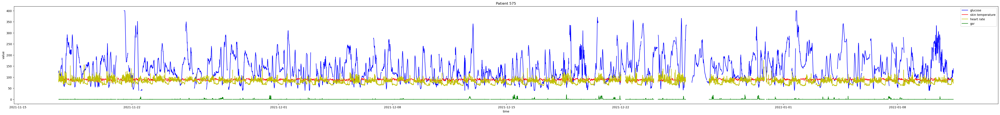

In [771]:
showFeatures(df_575, 'Patient 575', 1)

In [636]:
df_575.to_csv('data/575.csv')

In [48]:
df_glucose_all_575['ts'] = pd.to_datetime(df_glucose_all_575['ts'], dayfirst=True)
df_575_longest = df_glucose_all_575[df_glucose_all_575['ts'].between('2022-01-01 18:14:00', '2022-01-04 07:04:00')]
df_575_longest = df_575_longest.reset_index(drop=True)
df_575_longest.to_csv('mutivariate/data/575_1.1_731.csv', index=False)

In [17]:
glucose_575 = pd.DataFrame(list(zip(date_new_575, glucose_value_575)), columns=['time', 'glucose_value'])
df_glucose_nonmiss_575 = getLongestPeriod(glucose_575, 'glucose_value')
print('The longest period without any missing period is {}'.format(max(df_glucose_nonmiss_575['duration'])))
df_glucose_miss_575 = getMissing(glucose_575, 'glucose_value')
short_glucose_575 = df_glucose_miss_575[df_glucose_miss_575['duration'] < 24]
df_consecutive_575 = getLongest(df_glucose_nonmiss_575, df_glucose_miss_575, short_glucose_575)
print('The longest period with short missing period is {}'.format(max(df_consecutive_575['duration'])))

The longest period without any missing period is 731


NameError: name 'ranges' is not defined

In [904]:
max(df_glucose_miss_575['duration'])

136

In [938]:
gsr_575 = pd.DataFrame(list(zip(date_new_575, gsr_value_575)), columns=['time', 'gsr_value'])
df_gsr_miss_575 = getMissing(gsr_575, 'gsr_value')
print('The number of missing values in gsr is {}'.format(len(df_gsr_miss_575)))
print('The number of missing values longer than 2 hours in gsr is {}'.format(len(df_gsr_miss_575[df_gsr_miss_575['duration'] > 24])))
print('The longest missing period in gsr is {}'.format(max(df_gsr_miss_575['duration'])))

The number of missing values in gsr is 159
The number of missing values longer than 2 hours in gsr is 4
The longest missing period in gsr is 410


[Text(0.5, 0, 'Starting Date'), Text(0, 0.5, 'Duration')]

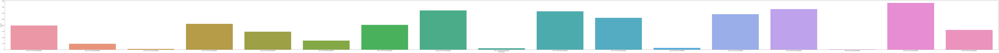

In [690]:
ax = sns.barplot(x=df_consecutive_575['start'], y=df_consecutive_575['duration'])

ax.figure.set_size_inches(200,10)
#ax.xaxis.set_major_formatter(DateFormatter("%y-%m-%d"))
ax.set(xlabel="Starting Date", ylabel="Duration")

In [1043]:
df_nonmiss_575 = interpolation(df_575, 1)
df_nonmiss_575.to_csv('data/nonmiss_575.csv')

# 588

In [49]:
df_glucose_training_588 =  readData('data/training_1/588_training/data_glucose_level.csv')
df_glucose_test_588 =  readData('data/testing_1/588_testing/data_glucose_level.csv')
df_glucose_all_588 = pd.concat([df_glucose_training_588, df_glucose_test_588])
df_glucose_all_588 = df_glucose_all_588.reset_index(drop=True)
print('The glucose data is recorded from {}'.format(df_glucose_all_588['ts'][0]))
print('The glucose data ends at {}'.format(df_glucose_all_588['ts'].iloc[-1]))

The glucose data is recorded from 30-08-2021 11:53:00
The glucose data ends at 24-10-2021 23:58:00


In [51]:
df_glucose_all_588['ts'] = pd.to_datetime(df_glucose_all_588['ts'], dayfirst=True)
df_588_longest = df_glucose_all_588[df_glucose_all_588['ts'].between('2021-09-11 13:38:00', '2021-09-17 12:58:00')]
df_588_longest = df_588_longest.reset_index(drop=True)
df_588_longest.to_csv('mutivariate/data/588_9.17_1720.csv', index=False)

In [68]:
df_skin_training_588 =  readData('data/training_1/588_training/data_basis_skin_temperature.csv')
df_skin_test_588 = readData('data/testing_1/588_testing/data_basis_skin_temperature.csv')
df_skin_all_588 = pd.concat([df_skin_training_588, df_skin_test_588])
df_skin_all_588 = df_skin_all_588.reset_index(drop=True)
print('The skin temporature data is recorded from {}'.format(df_skin_all_588['ts'][0]))
print('The skin temporature data ends at {}'.format(df_skin_all_588['ts'].iloc[-1]))

The skin temporature data is recorded from 30-08-2021 11:05:00
The skin temporature data ends at 24-10-2021 08:37:00


In [69]:
df_heart_training_588 =  readData('data/training_1/588_training/data_basis_heart_rate.csv')
df_heart_test_588 = readData('data/testing_1/588_testing/data_basis_heart_rate.csv')
df_heart_all_588 = pd.concat([df_heart_training_588, df_heart_test_588])
df_heart_all_588 = df_heart_all_588.reset_index(drop=True)
print('The heart rate data is recorded from {}'.format(df_heart_all_588['ts'][0]))
print('The heart rate data ends at {}'.format(df_heart_all_588['ts'].iloc[-1]))

The heart rate data is recorded from 30-08-2021 11:04:00
The heart rate data ends at 24-10-2021 08:36:00


In [70]:
df_gsr_training_588 =  readData('data/training_1/588_training/data_basis_gsr.csv')
df_gsr_test_588 = readData('data/testing_1/588_testing/data_basis_gsr.csv')
df_gsr_all_588 = pd.concat([df_gsr_training_588, df_gsr_test_588])
df_gsr_all_588 = df_gsr_all_588.reset_index(drop=True)
print('The gsr data is recorded from {}'.format(df_gsr_all_588['ts'][0]))
print('The gsr data ends at {}'.format(df_gsr_all_588['ts'].iloc[-1]))

The gsr data is recorded from 30-08-2021 11:05:00
The gsr data ends at 24-10-2021 08:37:00


In [71]:
date_new_588 = pd.date_range(start=datetime(2021, 8, 30, hour=11, minute=53), end=datetime(2021, 10, 24, hour=8, minute=37), freq='5min')
df_date_new_588 = pd.DataFrame(date_new_588, columns=['time'])

In [72]:
df_glucose_588, glucose_value_588 = dataSynchronize(df_glucose_all_588, df_date_new_588, '2021-8-30 11:45:00')
df_heart_588, heart_value_588 = dataSynchronize(df_heart_all_588, df_date_new_588, '2021-8-30 11:45:00')
df_skin_588, skin_value_588 = dataSynchronize(df_skin_all_588, df_date_new_588, '2021-8-30 11:45:00')
df_gsr_588, gsr_value_588 = dataSynchronize(df_gsr_all_588, df_date_new_588, '2021-8-30 11:45:00')

In [73]:
df_588 = pd.DataFrame(list(zip(date_new_588, glucose_value_588, skin_value_588, heart_value_588, gsr_value_588)), columns=['time', 'glucose_value', 'skin_temp_value', 'heart_rate_value', 'gsr_value'])

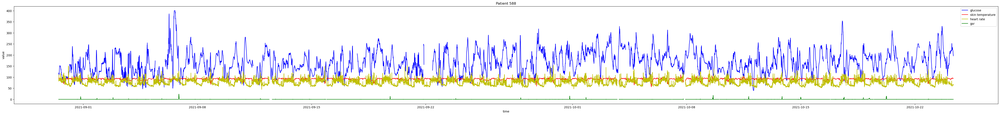

In [770]:
showFeatures(df_588, 'Patient 588', 1)

In [721]:
df_588.to_csv('data/588.csv')

In [75]:
heart_588 = pd.DataFrame(list(zip(date_new_588, heart_value_588)), columns=['time', 'heart_rate_value'])
df_heart_nonmiss_588 = getLongestPeriod(heart_588, 'heart_rate_value')
max(df_heart_nonmiss_588['duration'])

592

In [937]:
glucose_588 = pd.DataFrame(list(zip(date_new_588, glucose_value_588)), columns=['time', 'glucose_value'])
df_glucose_nonmiss_588 = getLongestPeriod(glucose_588, 'glucose_value')
print('The longest period without any missing period is {}'.format(max(df_glucose_nonmiss_588['duration'])))
df_glucose_miss_588 = getMissing(glucose_588, 'glucose_value')
short_glucose_588 = df_glucose_miss_588[df_glucose_miss_588['duration'] < 24]
df_consecutive_588 = getLongest(df_glucose_nonmiss_588, df_glucose_miss_588, short_glucose_588)
print('The longest period with short missing period is {}'.format(max(df_consecutive_588['duration'])))

The longest period without any missing period is 1721
The longest period with short missing period is 1721


In [905]:
max(df_glucose_miss_588['duration'])

150

In [936]:
gsr_588 = pd.DataFrame(list(zip(date_new_588, gsr_value_588)), columns=['time', 'gsr_value'])
df_gsr_miss_588 = getMissing(gsr_588, 'gsr_value')
print('The number of missing values in gsr is {}'.format(len(df_gsr_miss_588)))
print('The number of missing values longer than 2 hours in gsr is {}'.format(len(df_gsr_miss_588[df_gsr_miss_588['duration'] > 24])))
print('The longest missing period in gsr is {}'.format(max(df_gsr_miss_588['duration'])))

The number of missing values in gsr is 144
The number of missing values longer than 2 hours in gsr is 3
The longest missing period in gsr is 50


[Text(0.5, 0, 'Starting Date'), Text(0, 0.5, 'Duration')]

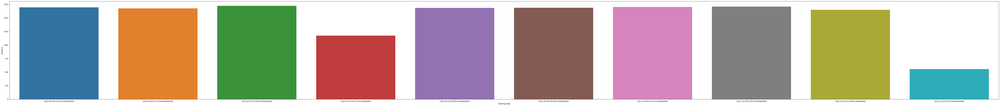

In [742]:
ax = sns.barplot(x=df_consecutive_588['start'], y=df_consecutive_588['duration'])

ax.figure.set_size_inches(100,10)
#ax.xaxis.set_major_formatter(DateFormatter("%y-%m-%d"))
ax.set(xlabel="Starting Date", ylabel="Duration")

In [1044]:
df_nonmiss_588 = interpolation(df_588, 1)
df_nonmiss_588.to_csv('data/nonmiss_588.csv')

# 591

In [52]:
df_glucose_training_591 =  readData('data/training_1/591_training/data_glucose_level.csv')
df_glucose_test_591 =  readData('data/testing_1/591_testing/data_glucose_level.csv')
df_glucose_all_591 = pd.concat([df_glucose_training_591, df_glucose_test_591])
df_glucose_all_591 = df_glucose_all_591.reset_index(drop=True)
print('The glucose data is recorded from {}'.format(df_glucose_all_591['ts'][0]))
print('The glucose data ends at {}'.format(df_glucose_all_591['ts'].iloc[-1]))

The glucose data is recorded from 30-11-2021 17:06:00
The glucose data ends at 23-01-2022 21:13:00


In [53]:
df_skin_training_591 =  readData('data/training_1/591_training/data_basis_skin_temperature.csv')
df_skin_test_591 = readData('data/testing_1/591_testing/data_basis_skin_temperature.csv')
df_skin_all_591 = pd.concat([df_skin_training_591, df_skin_test_591])
df_skin_all_591 = df_skin_all_591.reset_index(drop=True)
print('The skin temporature data is recorded from {}'.format(df_skin_all_591['ts'][0]))
print('The skin temporature data ends at {}'.format(df_skin_all_591['ts'].iloc[-1]))

The skin temporature data is recorded from 30-11-2021 15:40:00
The skin temporature data ends at 23-01-2022 23:55:00


In [54]:
df_heart_training_591 =  readData('data/training_1/591_training/data_basis_heart_rate.csv')
df_heart_test_591 = readData('data/testing_1/591_testing/data_basis_heart_rate.csv')
df_heart_all_591 = pd.concat([df_heart_training_591, df_heart_test_591])
df_heart_all_591 = df_heart_all_591.reset_index(drop=True)
print('The heart rate data is recorded from {}'.format(df_heart_all_591['ts'][0]))
print('The heart rate data ends at {}'.format(df_heart_all_591['ts'].iloc[-1]))

The heart rate data is recorded from 30-11-2021 15:40:00
The heart rate data ends at 23-01-2022 23:59:00


In [55]:
df_gsr_training_591 =  readData('data/training_1/591_training/data_basis_gsr.csv')
df_gsr_test_591 = readData('data/testing_1/591_testing/data_basis_gsr.csv')
df_gsr_all_591 = pd.concat([df_gsr_training_591, df_gsr_test_591])
df_gsr_all_591 = df_gsr_all_591.reset_index(drop=True)
print('The gsr data is recorded from {}'.format(df_gsr_all_591['ts'][0]))
print('The gsr data ends at {}'.format(df_gsr_all_591['ts'].iloc[-1]))

The gsr data is recorded from 30-11-2021 15:40:00
The gsr data ends at 23-01-2022 23:55:00


In [56]:
date_new_591 = pd.date_range(start=datetime(2021, 11, 30, hour=17, minute=6), end=datetime(2022, 1, 23, hour=21, minute=13), freq='5min')
df_date_new_591 = pd.DataFrame(date_new_591, columns=['time'])

In [57]:
df_glucose_591, glucose_value_591 = dataSynchronize(df_glucose_all_591, df_date_new_591, '2021-11-30 17:00:00')
df_heart_591, heart_value_591 = dataSynchronize(df_heart_all_591, df_date_new_591, '2021-11-30 17:00:00')
df_skin_591, skin_value_591 = dataSynchronize(df_skin_all_591, df_date_new_591, '2021-11-30 17:00:00')
df_gsr_591, gsr_value_591 = dataSynchronize(df_gsr_all_591, df_date_new_591, '2021-11-30 17:00:00')

In [58]:
df_591 = pd.DataFrame(list(zip(date_new_591, glucose_value_591, skin_value_591, heart_value_591, gsr_value_591)), columns=['time', 'glucose_value', 'skin_temp_value', 'heart_rate_value', 'gsr_value'])

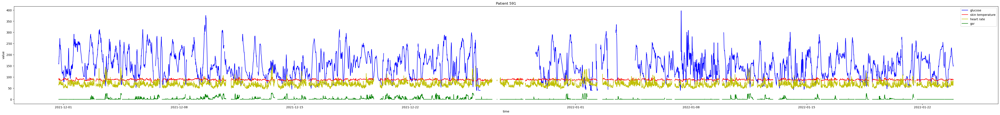

In [763]:
showFeatures(df_591, 'Patient 591', 1)

In [738]:
df_591.to_csv('data/591.csv')

In [143]:
heart_591 = pd.DataFrame(list(zip(date_new_591, heart_value_591)), columns=['time', 'heart_rate_value'])
df_heart_nonmiss_591 = getLongestPeriod(heart_591, 'heart_rate_value')
df_heart_nonmiss_591[df_heart_nonmiss_591['duration'] == 689]

,start,end,duration
7,2021-12-08 10:46:00,2021-12-10 20:06:00,689


In [59]:
df_glucose_all_591['ts'] = pd.to_datetime(df_glucose_all_591['ts'], dayfirst=True)
df_591_longest = df_glucose_all_591[df_glucose_all_591['ts'].between('2022-01-10 05:26:00', '2022-01-15 08:21:00')]
df_591_longest = df_591_longest.reset_index(drop=True)
df_591_longest.to_csv('mutivariate/data/591_1.10_1476.csv', index=False)

In [64]:
glucose_591 = pd.DataFrame(list(zip(date_new_591, glucose_value_591)), columns=['time', 'glucose_value'])
df_glucose_nonmiss_591 = getLongestPeriod(glucose_591, 'glucose_value')
df_glucose_nonmiss_591

,start,end,duration
0,2021-11-30 17:06:00,2021-12-02 03:06:00,409
1,2021-12-02 03:36:00,2021-12-03 08:51:00,352
2,2021-12-03 09:41:00,2021-12-04 19:11:00,403
3,2021-12-04 19:41:00,2021-12-06 11:01:00,473
4,2021-12-06 13:46:00,2021-12-06 19:26:00,69
5,2021-12-06 20:06:00,2021-12-08 10:56:00,467
6,2021-12-08 18:06:00,2021-12-09 18:11:00,290
7,2021-12-09 18:31:00,2021-12-10 17:21:00,275
8,2021-12-10 18:11:00,2021-12-11 19:16:00,302
9,2021-12-11 20:01:00,2021-12-12 17:36:00,260


In [934]:
glucose_591 = pd.DataFrame(list(zip(date_new_591, glucose_value_591)), columns=['time', 'glucose_value'])
df_glucose_nonmiss_591 = getLongestPeriod(glucose_591, 'glucose_value')
print('The longest period without any missing period is {}'.format(max(df_glucose_nonmiss_591['duration'])))
df_glucose_miss_591 = getMissing(glucose_591, 'glucose_value')
short_glucose_591 = df_glucose_miss_591[df_glucose_miss_591['duration'] < 24]
df_consecutive_591 = getLongest(df_glucose_nonmiss_591, df_glucose_miss_591, short_glucose_591)
print('The longest period with short missing period is {}'.format(max(df_consecutive_591['duration'])))

The longest period without any missing period is 1476
The longest period with short missing period is 1646


In [906]:
max(df_glucose_miss_591['duration'])

966

In [933]:
gsr_591 = pd.DataFrame(list(zip(date_new_591, gsr_value_591)), columns=['time', 'gsr_value'])
df_gsr_miss_591 = getMissing(gsr_591, 'gsr_value')
print('The number of missing values in gsr is {}'.format(len(df_gsr_miss_591)))
print('The number of missing values longer than 2 hours in gsr is {}'.format(len(df_gsr_miss_591[df_gsr_miss_591['duration'] > 24])))
print('The longest missing period in gsr is {}'.format(max(df_gsr_miss_591['duration'])))

The number of missing values in gsr is 67
The number of missing values longer than 2 hours in gsr is 19
The longest missing period in gsr is 108


[Text(0.5, 0, 'Starting Date'), Text(0, 0.5, 'Duration')]

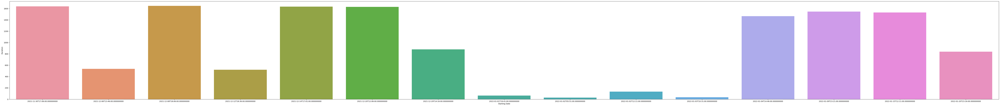

In [743]:
ax = sns.barplot(x=df_consecutive_591['start'], y=df_consecutive_591['duration'])

ax.figure.set_size_inches(100,10)
#ax.xaxis.set_major_formatter(DateFormatter("%y-%m-%d"))
ax.set(xlabel="Starting Date", ylabel="Duration")

In [1045]:
df_nonmiss_591 = interpolation(df_591, 1)
df_nonmiss_591.to_csv('data/nonmiss_591.csv')

# 540

In [748]:
df_glucose_training_540 =  readData('data/training_2/540_training/data_glucose_level.csv')
df_glucose_test_540 =  readData('data/testing_2/540_testing/data_glucose_level.csv')
df_glucose_all_540 = pd.concat([df_glucose_training_540, df_glucose_test_540])
df_glucose_all_540 = df_glucose_all_540.reset_index(drop=True)
print('The glucose data is recorded from {}'.format(df_glucose_all_540['ts'][0]))
print('The glucose data ends at {}'.format(df_glucose_all_540['ts'].iloc[-1]))

The glucose data is recorded from 19-05-2027 11:36:29
The glucose data ends at 14-07-2027 15:25:40


In [747]:
df_skin_training_540 =  readData('data/training_2/540_training/data_basis_skin_temperature.csv')
df_skin_test_540 = readData('data/testing_2/540_testing/data_basis_skin_temperature.csv')
df_skin_all_540 = pd.concat([df_skin_training_540, df_skin_test_540])
df_skin_all_540 = df_skin_all_540.reset_index(drop=True)
print('The skin temporature data is recorded from {}'.format(df_skin_all_540['ts'][0]))
print('The skin temporature data ends at {}'.format(df_skin_all_540['ts'].iloc[-1]))

The skin temporature data is recorded from 19-05-2027 09:55:00
The skin temporature data ends at 12-07-2027 22:28:00


In [745]:
df_acceleration_training_540 =  readData('data/training_2/540_training/data_acceleration.csv')
df_acceleration_test_540 = readData('data/testing_2/540_testing/data_acceleration.csv')
df_acceleration_all_540 = pd.concat([df_acceleration_training_540, df_acceleration_test_540])
df_acceleration_all_540 = df_acceleration_all_540.reset_index(drop=True)
print('The acceleration data is recorded from {}'.format(df_acceleration_all_540['ts'][0]))
print('The acceleration data ends at {}'.format(df_acceleration_all_540['ts'].iloc[-1]))

The acceleration data is recorded from 19-05-2027 09:55:00
The acceleration data ends at 12-07-2027 22:28:00


In [746]:
df_gsr_training_540 =  readData('data/training_2/540_training/data_basis_gsr.csv')
df_gsr_test_540 = readData('data/testing_2/540_testing/data_basis_gsr.csv')
df_gsr_all_540 = pd.concat([df_gsr_training_540, df_gsr_test_540])
df_gsr_all_540 = df_gsr_all_540.reset_index(drop=True)
print('The gsr data is recorded from {}'.format(df_gsr_all_540['ts'][0]))
print('The gsr data ends at {}'.format(df_gsr_all_540['ts'].iloc[-1]))

The gsr data is recorded from 19-05-2027 09:55:00
The gsr data ends at 12-07-2027 22:28:00


In [749]:
date_new_540 = pd.date_range(start=datetime(2027, 5, 19, hour=11, minute=36, second=29), end=datetime(2027, 7, 12, hour=22, minute=28), freq='5min')
df_date_new_540 = pd.DataFrame(date_new_540, columns=['time'])

In [981]:
df_glucose_540, glucose_value_540 = dataSynchronize(df_glucose_all_540, df_date_new_540, '2027-5-19 11:30:00')
df_acceleration_540, acceleration_value_540 = dataSynchronize(df_acceleration_all_540, df_date_new_540, '2027-5-19 11:30:00')
df_skin_540, skin_value_540 = dataSynchronize(df_skin_all_540, df_date_new_540, '2027-5-19 11:30:00')
df_gsr_540, gsr_value_540 = dataSynchronize(df_gsr_all_540, df_date_new_540, '2027-5-19 11:30:00')

In [982]:
df_540 = pd.DataFrame(list(zip(date_new_540, glucose_value_540, skin_value_540, acceleration_value_540, gsr_value_540)), columns=['time', 'glucose_value', 'skin_temp_value', 'acceleration_value', 'gsr_value'])

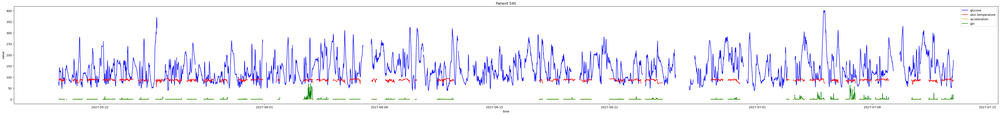

In [983]:
showFeatures(df_540, 'Patient 540', 2)

In [984]:
df_540.to_csv('data/540.csv')

In [765]:
len(df_540)

15682

In [932]:
glucose_540 = pd.DataFrame(list(zip(date_new_540, glucose_value_540)), columns=['time', 'glucose_value'])
df_glucose_nonmiss_540 = getLongestPeriod(glucose_540, 'glucose_value')
print('The longest period without any missing period is {}'.format(max(df_glucose_nonmiss_540['duration'])))
df_glucose_miss_540 = getMissing(glucose_540, 'glucose_value')
short_glucose_540 = df_glucose_miss_540[df_glucose_miss_540['duration'] < 24]
df_consecutive_540 = getLongest(df_glucose_nonmiss_540, df_glucose_miss_540, short_glucose_540)
print('The longest period with short missing period is {}'.format(max(df_consecutive_540['duration'])))

The longest period without any missing period is 946
The longest period with short missing period is 1713


In [907]:
max(df_glucose_miss_540['duration'])

235

In [931]:
gsr_540 = pd.DataFrame(list(zip(date_new_540, gsr_value_540)), columns=['time', 'gsr_value'])
df_gsr_miss_540 = getMissing(gsr_540, 'gsr_value')
print('The number of missing values in gsr is {}'.format(len(df_gsr_miss_540)))
print('The number of missing values longer than 2 hours in gsr is {}'.format(len(df_gsr_miss_540[df_gsr_miss_540['duration'] > 24])))
print('The longest missing period in gsr is {}'.format(max(df_gsr_miss_540['duration'])))

The number of missing values in gsr is 99
The number of missing values longer than 2 hours in gsr is 42
The longest missing period in gsr is 1493


[Text(0.5, 0, 'Starting Date'), Text(0, 0.5, 'Duration')]

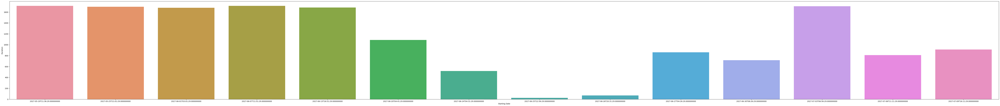

In [769]:
ax = sns.barplot(x=df_consecutive_540['start'], y=df_consecutive_540['duration'])

ax.figure.set_size_inches(100,10)
#ax.xaxis.set_major_formatter(DateFormatter("%y-%m-%d"))
ax.set(xlabel="Starting Date", ylabel="Duration")

Some values in skin temperature are 0

In [1122]:
df_nonmiss_540 = interpolation(df_540, 2)
df_nonmiss_540.to_csv('data/nonmiss_540.csv')

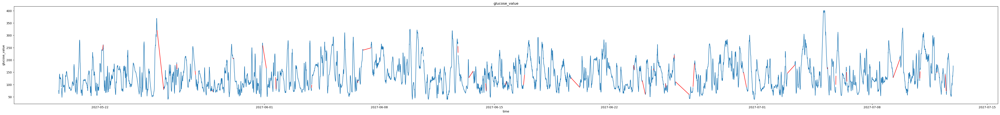

In [1132]:
showMissing(df_540, glucose_540, df_nonmiss_540, 'glucose_value')

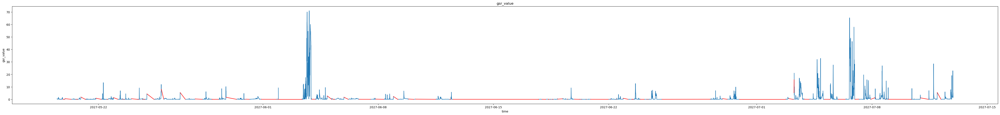

In [1133]:
showMissing(df_540, gsr_540, df_nonmiss_540, 'gsr_value')

# 544

In [775]:
df_glucose_training_544 =  readData('data/training_2/544_training/data_glucose_level.csv')
df_glucose_test_544 =  readData('data/testing_2/544_testing/data_glucose_level.csv')
df_glucose_all_544 = pd.concat([df_glucose_training_544, df_glucose_test_544])
df_glucose_all_544 = df_glucose_all_544.reset_index(drop=True)
print('The glucose data is recorded from {}'.format(df_glucose_all_544['ts'][0]))
print('The glucose data ends at {}'.format(df_glucose_all_544['ts'].iloc[-1]))

The glucose data is recorded from 11-05-2027 00:02:00
The glucose data ends at 04-07-2027 21:17:00


In [776]:
df_skin_training_544 =  readData('data/training_2/544_training/data_basis_skin_temperature.csv')
df_skin_test_544 = readData('data/testing_2/544_testing/data_basis_skin_temperature.csv')
df_skin_all_544 = pd.concat([df_skin_training_544, df_skin_test_544])
df_skin_all_544 = df_skin_all_544.reset_index(drop=True)
print('The skin temporature data is recorded from {}'.format(df_skin_all_544['ts'][0]))
print('The skin temporature data ends at {}'.format(df_skin_all_544['ts'].iloc[-1]))

The skin temporature data is recorded from 11-05-2027 10:25:00
The skin temporature data ends at 04-07-2027 23:59:00


In [777]:
df_acceleration_training_544 =  readData('data/training_2/544_training/data_acceleration.csv')
df_acceleration_test_544 = readData('data/testing_2/544_testing/data_acceleration.csv')
df_acceleration_all_544 = pd.concat([df_acceleration_training_544, df_acceleration_test_544])
df_acceleration_all_544 = df_acceleration_all_544.reset_index(drop=True)
print('The acceleration data is recorded from {}'.format(df_acceleration_all_544['ts'][0]))
print('The acceleration data ends at {}'.format(df_acceleration_all_544['ts'].iloc[-1]))

The acceleration data is recorded from 11-05-2027 10:25:00
The acceleration data ends at 04-07-2027 23:59:00


In [778]:
df_gsr_training_544 =  readData('data/training_2/544_training/data_basis_gsr.csv')
df_gsr_test_544 = readData('data/testing_2/544_testing/data_basis_gsr.csv')
df_gsr_all_544 = pd.concat([df_gsr_training_544, df_gsr_test_544])
df_gsr_all_544 = df_gsr_all_544.reset_index(drop=True)
print('The gsr data is recorded from {}'.format(df_gsr_all_544['ts'][0]))
print('The gsr data ends at {}'.format(df_gsr_all_544['ts'].iloc[-1]))

The gsr data is recorded from 11-05-2027 10:25:00
The gsr data ends at 04-07-2027 23:59:00


In [779]:
date_new_544 = pd.date_range(start=datetime(2027, 5, 11, hour=10, minute=25), end=datetime(2027, 7, 4, hour=21, minute=17), freq='5min')
df_date_new_544 = pd.DataFrame(date_new_544, columns=['time'])

In [977]:
df_glucose_544, glucose_value_544 = dataSynchronize(df_glucose_all_544, df_date_new_544, '2027-5-11 10:20:00')
df_acceleration_544, acceleration_value_544 = dataSynchronize(df_acceleration_all_544, df_date_new_544, '2027-5-11 10:20:00')
df_skin_544, skin_value_544 = dataSynchronize(df_skin_all_544, df_date_new_544, '2027-5-11 10:20:00')
df_gsr_544, gsr_value_544 = dataSynchronize(df_gsr_all_544, df_date_new_544, '2027-5-11 10:20:00')

In [978]:
df_544 = pd.DataFrame(list(zip(date_new_544, glucose_value_544, skin_value_544, acceleration_value_544, gsr_value_544)), columns=['time', 'glucose_value', 'skin_temp_value', 'acceleration_value', 'gsr_value'])

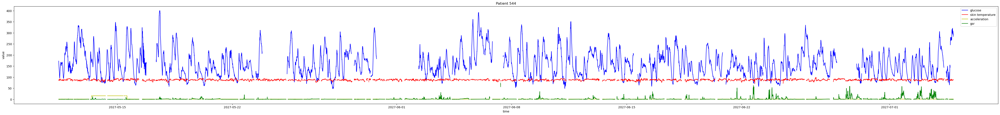

In [979]:
showFeatures(df_544, 'Patient 544', 2)

In [980]:
df_544.to_csv('data/544.csv')

In [786]:
len(df_544)

15682

In [930]:
glucose_544 = pd.DataFrame(list(zip(date_new_544, glucose_value_544)), columns=['time', 'glucose_value'])
df_glucose_nonmiss_544 = getLongestPeriod(glucose_544, 'glucose_value')
print('The longest period without any missing period is {}'.format(max(df_glucose_nonmiss_544['duration'])))
df_glucose_miss_544 = getMissing(glucose_544, 'glucose_value')
short_glucose_544 = df_glucose_miss_544[df_glucose_miss_544['duration'] < 24]
df_consecutive_544 = getLongest(df_glucose_nonmiss_544, df_glucose_miss_544, short_glucose_544)
print('The longest period with short missing period is {}'.format(max(df_consecutive_544['duration'])))

The longest period without any missing period is 1704
The longest period with short missing period is 1704


In [908]:
max(df_glucose_miss_544['duration'])

738

In [929]:
gsr_544 = pd.DataFrame(list(zip(date_new_544, gsr_value_544)), columns=['time', 'gsr_value'])
df_gsr_miss_544 = getMissing(gsr_544, 'gsr_value')
print('The number of missing values in gsr is {}'.format(len(df_gsr_miss_544)))
print('The number of missing values longer than 2 hours in gsr is {}'.format(len(df_gsr_miss_544[df_gsr_miss_544['duration'] > 24])))
print('The longest missing period in gsr is {}'.format(max(df_gsr_miss_544['duration'])))

The number of missing values in gsr is 180
The number of missing values longer than 2 hours in gsr is 24
The longest missing period in gsr is 63


[Text(0.5, 0, 'Starting Date'), Text(0, 0.5, 'Duration')]

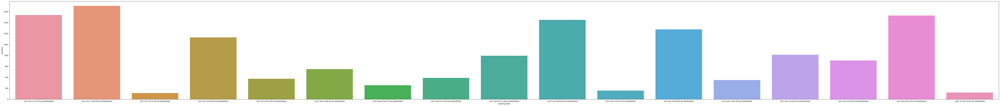

In [788]:
ax = sns.barplot(x=df_consecutive_544['start'], y=df_consecutive_544['duration'])

ax.figure.set_size_inches(100,10)
#ax.xaxis.set_major_formatter(DateFormatter("%y-%m-%d"))
ax.set(xlabel="Starting Date", ylabel="Duration")

In [1121]:
df_nonmiss_544 = interpolation(df_544, 2)
df_nonmiss_544.to_csv('data/nonmiss_544.csv')

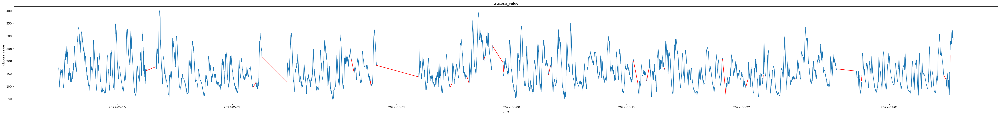

In [1130]:
showMissing(df_544, glucose_544, df_nonmiss_544, 'glucose_value')

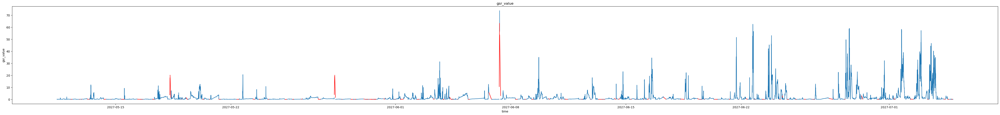

In [1131]:
showMissing(df_544, gsr_544, df_nonmiss_544, 'gsr_value')

# 552

In [882]:
df_glucose_training_552 =  readData('data/training_2/552_training/data_glucose_level.csv')
df_glucose_test_552 =  readData('data/testing_2/552_testing/data_glucose_level.csv')
df_glucose_all_552 = pd.concat([df_glucose_training_552, df_glucose_test_552])
df_glucose_all_552 = df_glucose_all_552.reset_index(drop=True)
print('The glucose data is recorded from {}'.format(df_glucose_all_552['ts'][0]))
print('The glucose data ends at {}'.format(df_glucose_all_552['ts'].iloc[-1]))

The glucose data is recorded from 16-04-2025 11:17:05
The glucose data ends at 07-06-2025 17:09:51


In [883]:
df_skin_training_552 =  readData('data/training_2/552_training/data_basis_skin_temperature.csv')
df_skin_test_552 = readData('data/testing_2/552_testing/data_basis_skin_temperature.csv')
df_skin_all_552 = pd.concat([df_skin_training_552, df_skin_test_552])
df_skin_all_552 = df_skin_all_552.reset_index(drop=True)
print('The skin temporature data is recorded from {}'.format(df_skin_all_552['ts'][0]))
print('The skin temporature data ends at {}'.format(df_skin_all_552['ts'].iloc[-1]))

The skin temporature data is recorded from 17-04-2025 20:01:00
The skin temporature data ends at 06-06-2025 21:33:00


In [888]:
df_acceleration_training_552 =  readData('data/training_2/552_training/data_acceleration.csv')
df_acceleration_test_552 = readData('data/testing_2/552_testing/data_acceleration.csv')
df_acceleration_all_552 = pd.concat([df_acceleration_training_552, df_acceleration_test_552])
df_acceleration_all_552 = df_acceleration_all_552.reset_index(drop=True)
print('The acceleration data is recorded from {}'.format(df_acceleration_all_552['ts'][0]))
print('The acceleration data ends at {}'.format(df_acceleration_all_552['ts'].iloc[-1]))

The acceleration data is recorded from 17-04-2025 20:01:00
The acceleration data ends at 06-06-2025 21:33:00


In [889]:
df_gsr_training_552 =  readData('data/training_2/552_training/data_basis_gsr.csv')
df_gsr_test_552 = readData('data/testing_2/552_testing/data_basis_gsr.csv')
df_gsr_all_552 = pd.concat([df_gsr_training_552, df_gsr_test_552])
df_gsr_all_552 = df_gsr_all_552.reset_index(drop=True)
print('The gsr data is recorded from {}'.format(df_gsr_all_552['ts'][0]))
print('The gsr data ends at {}'.format(df_gsr_all_552['ts'].iloc[-1]))

The gsr data is recorded from 17-04-2025 20:01:00
The gsr data ends at 06-06-2025 21:33:00


In [890]:
date_new_552 = pd.date_range(start=datetime(2025, 4, 17, hour=20, minute=1), end=datetime(2025, 6, 6, hour=17, minute=9), freq='5min')
df_date_new_552 = pd.DataFrame(date_new_552, columns=['time'])

In [973]:
df_glucose_552, glucose_value_552 = dataSynchronize(df_glucose_all_552, df_date_new_552, '2025-4-17 19:55:00')
df_acceleration_552, acceleration_value_552 = dataSynchronize(df_acceleration_all_552, df_date_new_552, '2025-4-17 19:55:00')
df_skin_552, skin_value_552 = dataSynchronize(df_skin_all_552, df_date_new_552, '2025-4-17 19:55:00')
df_gsr_552, gsr_value_552 = dataSynchronize(df_gsr_all_552, df_date_new_552, '2025-4-17 19:55:00')

In [974]:
df_552 = pd.DataFrame(list(zip(date_new_552, glucose_value_552, skin_value_552, acceleration_value_552, gsr_value_552)), columns=['time', 'glucose_value', 'skin_temp_value', 'acceleration_value', 'gsr_value'])

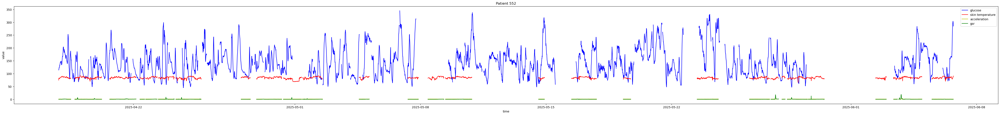

In [975]:
showFeatures(df_552, 'Patient 552', 2)

In [976]:
df_552.to_csv('data/552.csv')

In [895]:
len(df_552)

14365

In [927]:
glucose_552 = pd.DataFrame(list(zip(date_new_552, glucose_value_552)), columns=['time', 'glucose_value'])
df_glucose_nonmiss_552 = getLongestPeriod(glucose_552, 'glucose_value')
print('The longest period without any missing period is {}'.format(max(df_glucose_nonmiss_552['duration'])))
df_glucose_miss_552 = getMissing(glucose_552, 'glucose_value')
short_glucose_552 = df_glucose_miss_552[df_glucose_miss_552['duration'] < 24]
df_consecutive_552 = getLongest(df_glucose_nonmiss_552, df_glucose_miss_552, short_glucose_552)
print('The longest period with short missing period is {}'.format(max(df_consecutive_552['duration'])))

The longest period without any missing period is 578
The longest period with short missing period is 1674


In [909]:
max(df_glucose_miss_552['duration'])

1415

In [926]:
gsr_552 = pd.DataFrame(list(zip(date_new_552, gsr_value_552)), columns=['time', 'gsr_value'])
df_gsr_miss_552 = getMissing(gsr_552, 'gsr_value')
print('The number of missing values in gsr is {}'.format(len(df_gsr_miss_552)))
print('The number of missing values longer than 2 hours in gsr is {}'.format(len(df_gsr_miss_552[df_gsr_miss_552['duration'] > 24])))
print('The longest missing period in gsr is {}'.format(max(df_gsr_miss_552['duration'])))

The number of missing values in gsr is 27
The number of missing values longer than 2 hours in gsr is 18
The longest missing period in gsr is 1069


In [928]:
df_gsr_miss_552[df_gsr_miss_552['duration'] > 24]

,start,end,duration
0,2025-04-18 12:26:00,2025-04-18 17:26:00,61
1,2025-04-20 05:41:00,2025-04-20 16:11:00,127
2,2025-04-22 03:46:00,2025-04-22 08:36:00,59
6,2025-04-25 18:41:00,2025-04-28 00:01:00,641
7,2025-04-28 12:41:00,2025-04-28 20:36:00,96
10,2025-05-02 13:11:00,2025-05-04 13:51:00,585
11,2025-05-05 03:51:00,2025-05-07 07:11:00,617
12,2025-05-07 21:21:00,2025-05-08 09:56:00,152
14,2025-05-10 21:01:00,2025-05-14 14:01:00,1069
15,2025-05-14 22:06:00,2025-05-16 10:06:00,433


[Text(0.5, 0, 'Starting Date'), Text(0, 0.5, 'Duration')]

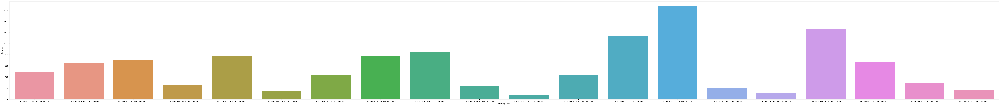

In [897]:
ax = sns.barplot(x=df_consecutive_552['start'], y=df_consecutive_552['duration'])

ax.figure.set_size_inches(100,10)
#ax.xaxis.set_major_formatter(DateFormatter("%y-%m-%d"))
ax.set(xlabel="Starting Date", ylabel="Duration")

In [1120]:
df_nonmiss_552 = interpolation(df_552, 2)
df_nonmiss_552.to_csv('data/nonmiss_552.csv')

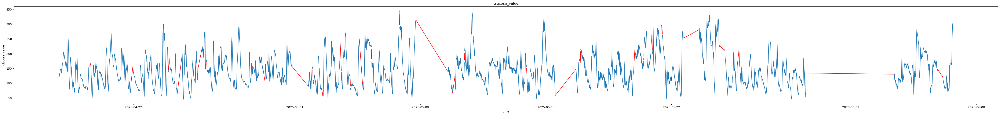

In [1128]:
showMissing(df_552, glucose_552, df_nonmiss_552, 'glucose_value')

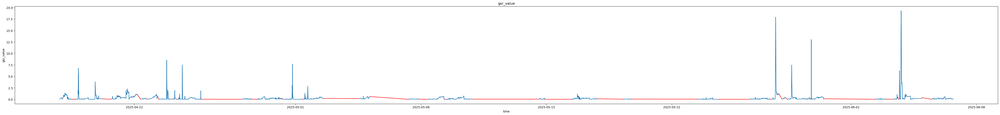

In [1129]:
showMissing(df_552, gsr_552, df_nonmiss_552, 'gsr_value')

# 567


In [884]:
df_glucose_training_567 =  readData('data/training_2/567_training/data_glucose_level.csv')
df_glucose_test_567 =  readData('data/testing_2/567_testing/data_glucose_level.csv')
df_glucose_all_567 = pd.concat([df_glucose_training_567, df_glucose_test_567])
df_glucose_all_567 = df_glucose_all_567.reset_index(drop=True)
print('The glucose data is recorded from {}'.format(df_glucose_all_567['ts'][0]))
print('The glucose data ends at {}'.format(df_glucose_all_567['ts'].iloc[-1]))

The glucose data is recorded from 28-12-2026 00:04:30
The glucose data ends at 22-02-2027 23:12:13


In [804]:
df_skin_training_567 =  readData('data/training_2/567_training/data_basis_skin_temperature.csv')
df_skin_test_567 = readData('data/testing_2/567_testing/data_basis_skin_temperature.csv')
df_skin_all_567 = pd.concat([df_skin_training_567, df_skin_test_567])
df_skin_all_567 = df_skin_all_567.reset_index(drop=True)
print('The skin temporature data is recorded from {}'.format(df_skin_all_567['ts'][0]))
print('The skin temporature data ends at {}'.format(df_skin_all_567['ts'].iloc[-1]))

The skin temporature data is recorded from 28-12-2026 08:56:00
The skin temporature data ends at 23-02-2027 08:10:00


In [805]:
df_acceleration_training_567 =  readData('data/training_2/567_training/data_acceleration.csv')
df_acceleration_test_567 = readData('data/testing_2/567_testing/data_acceleration.csv')
df_acceleration_all_567 = pd.concat([df_acceleration_training_567, df_acceleration_test_567])
df_acceleration_all_567 = df_acceleration_all_567.reset_index(drop=True)
print('The acceleration data is recorded from {}'.format(df_acceleration_all_567['ts'][0]))
print('The acceleration data ends at {}'.format(df_acceleration_all_567['ts'].iloc[-1]))

The acceleration data is recorded from 28-12-2026 08:56:00
The acceleration data ends at 23-02-2027 08:10:00


In [806]:
df_gsr_training_567 =  readData('data/training_2/567_training/data_basis_gsr.csv')
df_gsr_test_567 = readData('data/testing_2/567_testing/data_basis_gsr.csv')
df_gsr_all_567 = pd.concat([df_gsr_training_567, df_gsr_test_567])
df_gsr_all_567 = df_gsr_all_567.reset_index(drop=True)
print('The gsr data is recorded from {}'.format(df_gsr_all_567['ts'][0]))
print('The gsr data ends at {}'.format(df_gsr_all_567['ts'].iloc[-1]))

The gsr data is recorded from 28-12-2026 08:56:00
The gsr data ends at 23-02-2027 08:10:00


In [807]:
date_new_567 = pd.date_range(start=datetime(2026, 12, 28, hour=8, minute=56), end=datetime(2027, 2, 22, hour=23, minute=12), freq='5min')
df_date_new_567 = pd.DataFrame(date_new_567, columns=['time'])

In [969]:
df_glucose_567, glucose_value_567 = dataSynchronize(df_glucose_all_567, df_date_new_567, '2026-12-28 8:50:00')
df_acceleration_567, acceleration_value_567 = dataSynchronize(df_acceleration_all_567, df_date_new_567, '2026-12-28 8:50:00')
df_skin_567, skin_value_567 = dataSynchronize(df_skin_all_567, df_date_new_567, '2026-12-28 8:50:00')
df_gsr_567, gsr_value_567 = dataSynchronize(df_gsr_all_567, df_date_new_567, '2026-12-28 8:50:00')

In [970]:
df_567 = pd.DataFrame(list(zip(date_new_567, glucose_value_567, skin_value_567, acceleration_value_567, gsr_value_567)), columns=['time', 'glucose_value', 'skin_temp_value', 'acceleration_value', 'gsr_value'])

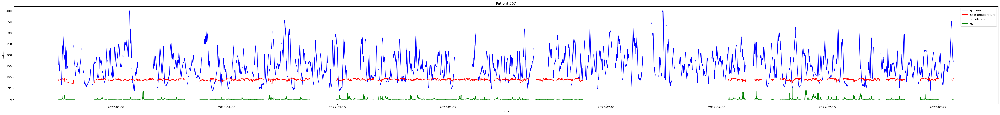

In [971]:
showFeatures(df_567, 'Patient 567', 2)

In [972]:
df_567.to_csv('data/567.csv')

In [812]:
len(df_567)

16299

In [925]:
glucose_567 = pd.DataFrame(list(zip(date_new_567, glucose_value_567)), columns=['time', 'glucose_value'])
df_glucose_nonmiss_567 = getLongestPeriod(glucose_567, 'glucose_value')
print('The longest period without any missing period is {}'.format(max(df_glucose_nonmiss_567['duration'])))
df_glucose_miss_567 = getMissing(glucose_567, 'glucose_value')
short_glucose_567 = df_glucose_miss_567[df_glucose_miss_567['duration'] < 24]
df_consecutive_567 = getLongest(df_glucose_nonmiss_567, df_glucose_miss_567, short_glucose_567)
print('The longest period with short missing period is {}'.format(max(df_consecutive_567['duration'])))

The longest period without any missing period is 509
The longest period with short missing period is 1044


In [910]:
max(df_glucose_miss_567['duration'])

315

In [1113]:
acceleration_567 = pd.DataFrame(list(zip(date_new_567, acceleration_value_567)), columns=['time', 'acceleration_value'])
skin_567 = pd.DataFrame(list(zip(date_new_567, skin_value_567)), columns=['time', 'skin_value'])
gsr_567 = pd.DataFrame(list(zip(date_new_567, gsr_value_567)), columns=['time', 'gsr_value'])
df_gsr_miss_567 = getMissing(gsr_567, 'gsr_value')
print('The number of missing values in gsr is {}'.format(len(df_gsr_miss_567)))
print('The number of missing values longer than 2 hours in gsr is {}'.format(len(df_gsr_miss_567[df_gsr_miss_567['duration'] > 24])))
print('The longest missing period in gsr is {}'.format(max(df_gsr_miss_567['duration'])))

The number of missing values in gsr is 215
The number of missing values longer than 2 hours in gsr is 25
The longest missing period in gsr is 2651


[Text(0.5, 0, 'Starting Date'), Text(0, 0.5, 'Duration')]

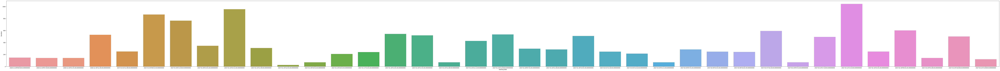

In [815]:
ax = sns.barplot(x=df_consecutive_567['start'], y=df_consecutive_567['duration'])

ax.figure.set_size_inches(150,10)
#ax.xaxis.set_major_formatter(DateFormatter("%y-%m-%d"))
ax.set(xlabel="Starting Date", ylabel="Duration")

In [1111]:
df_nonmiss_567 = interpolation(df_567, 2)
df_nonmiss_567.to_csv('data/nonmiss_567.csv')

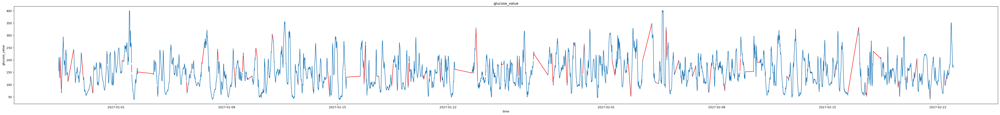

In [1112]:
showMissing(df_567, glucose_567, df_nonmiss_567, 'glucose_value')

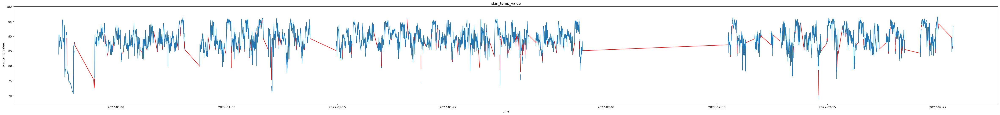

In [1114]:
showMissing(df_567, skin_567, df_nonmiss_567, 'skin_temp_value')

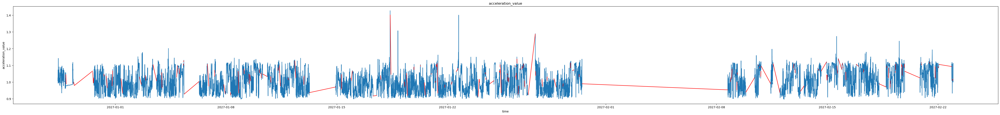

In [1115]:
showMissing(df_567, acceleration_567, df_nonmiss_567, 'acceleration_value')

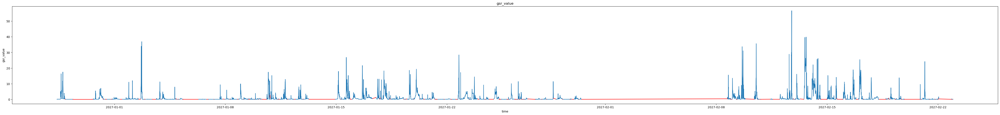

In [1116]:
showMissing(df_567, gsr_567, df_nonmiss_567, 'gsr_value')

# 584

In [885]:
df_glucose_training_584 =  readData('data/training_2/584_training/data_glucose_level.csv')
df_glucose_test_584 =  readData('data/testing_2/584_testing/data_glucose_level.csv')
df_glucose_all_584 = pd.concat([df_glucose_training_584, df_glucose_test_584])
df_glucose_all_584 = df_glucose_all_584.reset_index(drop=True)
print('The glucose data is recorded from {}'.format(df_glucose_all_584['ts'][0]))
print('The glucose data ends at {}'.format(df_glucose_all_584['ts'].iloc[-1]))

The glucose data is recorded from 14-05-2025 00:03:00
The glucose data ends at 09-07-2025 09:32:00


In [817]:
df_skin_training_584 =  readData('data/training_2/584_training/data_basis_skin_temperature.csv')
df_skin_test_584 = readData('data/testing_2/584_testing/data_basis_skin_temperature.csv')
df_skin_all_584 = pd.concat([df_skin_training_584, df_skin_test_584])
df_skin_all_584 = df_skin_all_584.reset_index(drop=True)
print('The skin temporature data is recorded from {}'.format(df_skin_all_584['ts'][0]))
print('The skin temporature data ends at {}'.format(df_skin_all_584['ts'].iloc[-1]))

The skin temporature data is recorded from 14-05-2025 10:13:00
The skin temporature data ends at 09-07-2025 09:16:00


In [818]:
df_acceleration_training_584 =  readData('data/training_2/584_training/data_acceleration.csv')
df_acceleration_test_584 = readData('data/testing_2/584_testing/data_acceleration.csv')
df_acceleration_all_584 = pd.concat([df_acceleration_training_584, df_acceleration_test_584])
df_acceleration_all_584 = df_acceleration_all_584.reset_index(drop=True)
print('The acceleration data is recorded from {}'.format(df_acceleration_all_584['ts'][0]))
print('The acceleration data ends at {}'.format(df_acceleration_all_584['ts'].iloc[-1]))

The acceleration data is recorded from 14-05-2025 10:13:00
The acceleration data ends at 09-07-2025 09:16:00


In [819]:
df_gsr_training_584 =  readData('data/training_2/584_training/data_basis_gsr.csv')
df_gsr_test_584 = readData('data/testing_2/584_testing/data_basis_gsr.csv')
df_gsr_all_584 = pd.concat([df_gsr_training_584, df_gsr_test_584])
df_gsr_all_584 = df_gsr_all_584.reset_index(drop=True)
print('The gsr data is recorded from {}'.format(df_gsr_all_584['ts'][0]))
print('The gsr data ends at {}'.format(df_gsr_all_584['ts'].iloc[-1]))

The gsr data is recorded from 14-05-2025 10:13:00
The gsr data ends at 09-07-2025 09:16:00


In [820]:
date_new_584 = pd.date_range(start=datetime(2025, 5, 14, hour=10, minute=13), end=datetime(2025, 7, 9, hour=9, minute=16), freq='5min')
df_date_new_584 = pd.DataFrame(date_new_584, columns=['time'])

In [964]:
df_glucose_584, glucose_value_584 = dataSynchronize(df_glucose_all_584, df_date_new_584, '2025-5-14 10:10:00')
df_acceleration_584, acceleration_value_584 = dataSynchronize(df_acceleration_all_584, df_date_new_584, '2025-5-14 10:10:00')
df_skin_584, skin_value_584 = dataSynchronize(df_skin_all_584, df_date_new_584, '2025-5-14 10:10:00')
df_gsr_584, gsr_value_584 = dataSynchronize(df_gsr_all_584, df_date_new_584, '2025-5-14 10:10:00')

In [965]:
df_584 = pd.DataFrame(list(zip(date_new_584, glucose_value_584, skin_value_584, acceleration_value_584, gsr_value_584)), columns=['time', 'glucose_value', 'skin_temp_value', 'acceleration_value', 'gsr_value'])

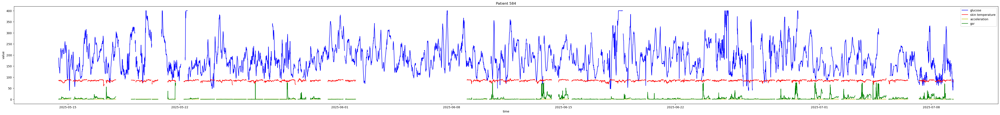

In [966]:
showFeatures(df_584, 'Patient 584', 2)

In [967]:
df_584.to_csv('data/584.csv')

In [968]:
len(df_584)

16116

In [921]:
glucose_584 = pd.DataFrame(list(zip(date_new_584, glucose_value_584)), columns=['time', 'glucose_value'])
df_glucose_nonmiss_584 = getLongestPeriod(glucose_584, 'glucose_value')
print('The longest period without any missing period is {}'.format(max(df_glucose_nonmiss_584['duration'])))
df_glucose_miss_584 = getMissing(glucose_584, 'glucose_value')
short_glucose_584 = df_glucose_miss_584[df_glucose_miss_584['duration'] < 24]
df_consecutive_584 = getLongest(df_glucose_nonmiss_584, df_glucose_miss_584, short_glucose_584)
print('The longest period with short missing period is {}'.format(max(df_consecutive_584['duration'])))

The longest period without any missing period is 939
The longest period with short missing period is 1944


In [911]:
max(df_glucose_miss_584['duration'])

202

In [923]:
gsr_584 = pd.DataFrame(list(zip(date_new_584, gsr_value_584)), columns=['time', 'gsr_value'])
df_gsr_miss_584 = getMissing(gsr_584, 'gsr_value')
print('The number of missing values in gsr is {}'.format(len(df_gsr_miss_584)))
print('The number of missing values longer than 2 hours in gsr is {}'.format(len(df_gsr_miss_584[df_gsr_miss_584['duration'] > 24])))
print('The longest missing period in gsr is {}'.format(max(df_gsr_miss_584['duration'])))

The number of missing values in gsr is 52
The number of missing values longer than 2 hours in gsr is 24
The longest missing period in gsr is 2002


[Text(0.5, 0, 'Starting Date'), Text(0, 0.5, 'Duration')]

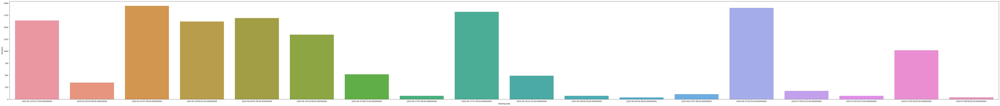

In [827]:
ax = sns.barplot(x=df_consecutive_584['start'], y=df_consecutive_584['duration'])

ax.figure.set_size_inches(100,10)
#ax.xaxis.set_major_formatter(DateFormatter("%y-%m-%d"))
ax.set(xlabel="Starting Date", ylabel="Duration")

In [1117]:
df_nonmiss_584 = interpolation(df_584, 2)
df_nonmiss_584.to_csv('data/nonmiss_584.csv')

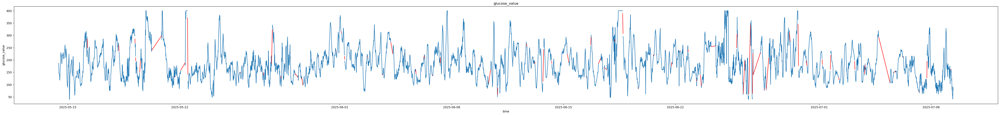

In [1125]:
showMissing(df_584, glucose_584, df_nonmiss_584, 'glucose_value')

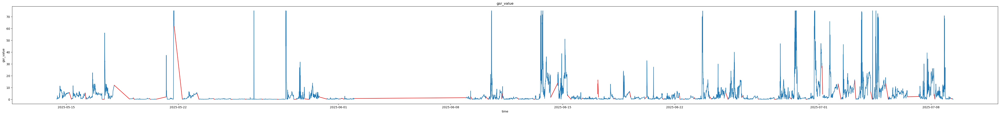

In [1127]:
showMissing(df_584, gsr_584, df_nonmiss_584, 'gsr_value')

# 596

In [886]:
df_glucose_training_596 =  readData('data/training_2/596_training/data_glucose_level.csv')
df_glucose_test_596 =  readData('data/testing_2/596_testing/data_glucose_level.csv')
df_glucose_all_596 = pd.concat([df_glucose_training_596, df_glucose_test_596])
df_glucose_all_596 = df_glucose_all_596.reset_index(drop=True)
print('The glucose data is recorded from {}'.format(df_glucose_all_596['ts'][0]))
print('The glucose data ends at {}'.format(df_glucose_all_596['ts'].iloc[-1]))

The glucose data is recorded from 09-04-2027 16:15:00
The glucose data ends at 06-06-2027 10:11:00


In [887]:
df_skin_training_596 =  readData('data/training_2/596_training/data_basis_skin_temperature.csv')
df_skin_test_596 = readData('data/testing_2/596_testing/data_basis_skin_temperature.csv')
df_skin_all_596 = pd.concat([df_skin_training_596, df_skin_test_596])
df_skin_all_596 = df_skin_all_596.reset_index(drop=True)
print('The skin temporature data is recorded from {}'.format(df_skin_all_596['ts'][0]))
print('The skin temporature data ends at {}'.format(df_skin_all_596['ts'].iloc[-1]))

The skin temporature data is recorded from 07-04-2027 18:40:00
The skin temporature data ends at 06-06-2027 12:52:00


In [831]:
df_acceleration_training_596 =  readData('data/training_2/596_training/data_acceleration.csv')
df_acceleration_test_596 = readData('data/testing_2/596_testing/data_acceleration.csv')
df_acceleration_all_596 = pd.concat([df_acceleration_training_596, df_acceleration_test_596])
df_acceleration_all_596 = df_acceleration_all_596.reset_index(drop=True)
print('The acceleration data is recorded from {}'.format(df_acceleration_all_596['ts'][0]))
print('The acceleration data ends at {}'.format(df_acceleration_all_596['ts'].iloc[-1]))

The acceleration data is recorded from 07-04-2027 18:40:00
The acceleration data ends at 06-06-2027 12:52:00


In [832]:
df_gsr_training_596 =  readData('data/training_2/596_training/data_basis_gsr.csv')
df_gsr_test_596 = readData('data/testing_2/596_testing/data_basis_gsr.csv')
df_gsr_all_596 = pd.concat([df_gsr_training_596, df_gsr_test_596])
df_gsr_all_596 = df_gsr_all_596.reset_index(drop=True)
print('The gsr data is recorded from {}'.format(df_gsr_all_596['ts'][0]))
print('The gsr data ends at {}'.format(df_gsr_all_596['ts'].iloc[-1]))

The gsr data is recorded from 07-04-2027 18:40:00
The gsr data ends at 06-06-2027 12:52:00


In [873]:
date_new_596 = pd.date_range(start=datetime(2027, 4, 9, hour=17, minute=6), end=datetime(2027, 6, 6, hour=10, minute=11), freq='5min')
df_date_new_596 = pd.DataFrame(date_new_596, columns=['time'])

In [957]:
df_glucose_596, glucose_value_596 = dataSynchronize(df_glucose_all_596, df_date_new_596, '2027-4-9 17:00:00')
df_acceleration_596, acceleration_value_596 = dataSynchronize(df_acceleration_all_596, df_date_new_596, '2027-4-9 17:00:00')
df_skin_596, skin_value_596 = dataSynchronize(df_skin_all_596, df_date_new_596, '2027-4-9 17:00:00')
df_gsr_596, gsr_value_596 = dataSynchronize(df_gsr_all_596, df_date_new_596, '2027-4-9 17:00:00')

In [958]:
df_596 = pd.DataFrame(list(zip(date_new_596, glucose_value_596, skin_value_596, acceleration_value_596, gsr_value_596)), columns=['time', 'glucose_value', 'skin_temp_value', 'acceleration_value', 'gsr_value'])

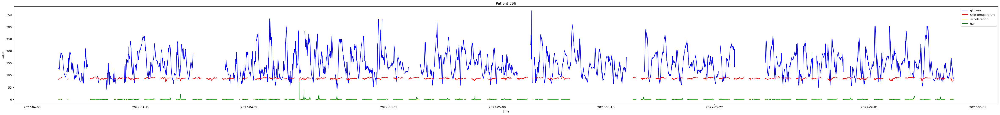

In [959]:
showFeatures(df_596, 'Patient 596', 2)

In [960]:
df_596.to_csv('data/596.csv')

In [879]:
len(df_596)

16621

In [1057]:
glucose_596 = pd.DataFrame(list(zip(date_new_596, glucose_value_596)), columns=['time', 'glucose_value'])
skin_596 = pd.DataFrame(list(zip(date_new_596, skin_value_596)), columns=['time', 'skin_temp_value'])
acceleration_596 = pd.DataFrame(list(zip(date_new_596, acceleration_value_596)), columns=['time', 'acceleration_value'])
gsr_596 = pd.DataFrame(list(zip(date_new_596, gsr_value_596)), columns=['time', 'gsr_value'])

In [961]:
df_glucose_nonmiss_596 = getLongestPeriod(glucose_596, 'glucose_value')
print('The longest period without any missing period is {}'.format(max(df_glucose_nonmiss_596['duration'])))
df_glucose_miss_596 = getMissing(glucose_596, 'glucose_value')
short_glucose_596 = df_glucose_miss_596[df_glucose_miss_596['duration'] < 24]
df_consecutive_596 = getLongest(df_glucose_nonmiss_596, df_glucose_miss_596, short_glucose_596)
print('The longest period with short missing period is {}'.format(max(df_consecutive_596['duration'])))

The longest period without any missing period is 1715
The longest period with short missing period is 1715


In [962]:
max(df_glucose_miss_596['duration'])

592

In [963]:
gsr_596 = pd.DataFrame(list(zip(date_new_596, gsr_value_596)), columns=['time', 'gsr_value'])
df_gsr_miss_596 = getMissing(gsr_596, 'gsr_value')
print('The number of missing values in gsr is {}'.format(len(df_gsr_miss_596)))
print('The number of missing values longer than 2 hours in gsr is {}'.format(len(df_gsr_miss_596[df_gsr_miss_596['duration'] > 24])))
print('The longest missing period in gsr is {}'.format(max(df_gsr_miss_596['duration'])))

The number of missing values in gsr is 454
The number of missing values longer than 2 hours in gsr is 56
The longest missing period in gsr is 1176


[Text(0.5, 0, 'Starting Date'), Text(0, 0.5, 'Duration')]

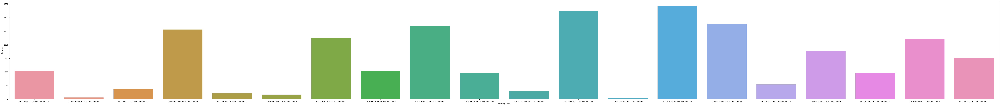

In [881]:
ax = sns.barplot(x=df_consecutive_596['start'], y=df_consecutive_596['duration'])

ax.figure.set_size_inches(100,10)
#ax.xaxis.set_major_formatter(DateFormatter("%y-%m-%d"))
ax.set(xlabel="Starting Date", ylabel="Duration")

In [1105]:
df_nonmiss_596 = interpolation(df_596, 2)
df_nonmiss_596.to_csv('data/nonmiss_596.csv')

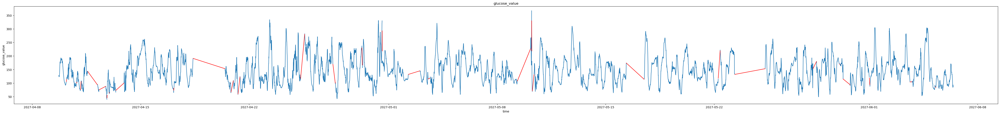

In [1106]:
showMissing(df_596, glucose_596, df_nonmiss_596, 'glucose_value')

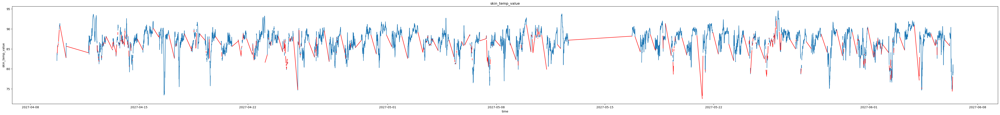

In [1107]:
showMissing(df_596, skin_596, df_nonmiss_596, 'skin_temp_value')

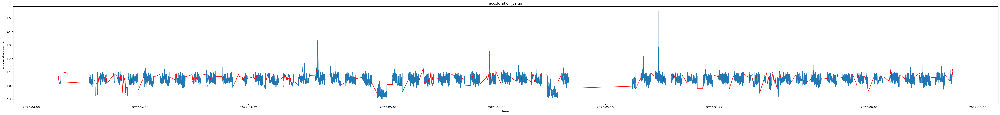

In [1108]:
showMissing(df_596, acceleration_596, df_nonmiss_596, 'acceleration_value')

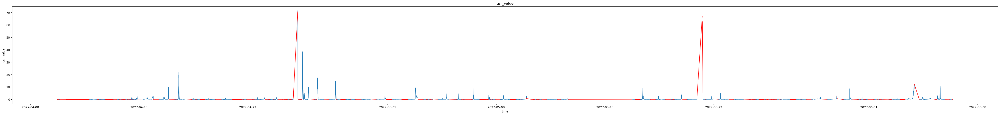

In [1109]:
showMissing(df_596, gsr_596, df_nonmiss_596, 'gsr_value')

# summary

1. The longest period with only some short missing values is 
2. Really big gaps (skin temperature in 567, 584 -> about 9 days)
3. Mutiple small gaps (596)
4. big + multiple gaps (552(worst), 540)

1. The consecutive glucose data with short missing periods (longest)
2. interpolate all missing values

# Data Smoothing

In [18]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

In [13]:
data_570 = pd.read_csv('data/nonmiss_570.csv')
time = data_570['time']

0        2021-12-08 00:04:00
1        2021-12-08 00:09:00
2        2021-12-08 00:14:00
3        2021-12-08 00:19:00
4        2021-12-08 00:24:00
                ...         
14322    2022-01-26 17:34:00
14323    2022-01-26 17:39:00
14324    2022-01-26 17:44:00
14325    2022-01-26 17:49:00
14326    2022-01-26 17:54:00
Name: time, Length: 14327, dtype: object

In [14]:
data_570 = data_570.drop(['Unnamed: 0', 'time'], axis=1)
data_570

,glucose_value,skin_temp_value,heart_rate_value,gsr_value
0,125.0,85.10,63.0,0.000087
1,124.0,85.10,63.0,0.000097
2,125.0,85.10,62.0,0.000098
3,125.0,85.10,62.0,0.000107
4,121.0,85.10,62.0,0.000139
...,...,...,...,...
14322,161.0,88.70,82.0,0.000053
14323,160.0,88.70,83.0,0.000055
14324,160.0,88.70,82.0,0.000051
14325,161.0,88.34,83.0,0.000050


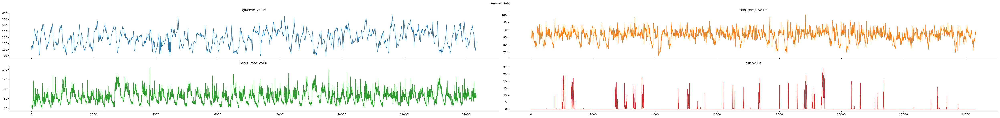

In [21]:
titles = ['glucose_value', 'skin_temp_value', 'heart_rate_value', 'gsr_value']
axes = data_570.plot(subplots=True, figsize=(50, 6), layout=(2, 2), title=titles, legend=False, rot=0, lw=1)
for ax in axes.flatten():
    ax.set_xlabel('')

plt.suptitle('Sensor Data')
plt.gcf().tight_layout()
sns.despine();

In [26]:
from statsmodels.tsa.stattools import adfuller

for i in range(len(titles)):
    print(' > Is the ' + str(titles[i]) + ' stationary ?')
    dftest = adfuller(data_570[titles[i]], autolag='AIC')
    print("Test statistic = {:.3f}".format(dftest[0]))
    print("P-value = {:.3f}".format(dftest[1]))
    print("Critical values :")
    for k, v in dftest[4].items():
        print("\t{}: {} - The data is {} stationary with {}% confidence".format(k, v, "not" if v<dftest[0] else "", 100-int(k[:-1])))

 > Is the glucose_value stationary ?
Test statistic = -10.451
P-value = 0.000
Critical values :
	1%: -3.4308075998607617 - The data is  stationary with 99% confidence
	5%: -2.8617422386080547 - The data is  stationary with 95% confidence
	10%: -2.566877646857187 - The data is  stationary with 90% confidence
 > Is the skin_temp_value stationary ?
Test statistic = -13.052
P-value = 0.000
Critical values :
	1%: -3.4308070242003867 - The data is  stationary with 99% confidence
	5%: -2.8617419842115743 - The data is  stationary with 95% confidence
	10%: -2.566877511444524 - The data is  stationary with 90% confidence
 > Is the heart_rate_value stationary ?
Test statistic = -10.808
P-value = 0.000
Critical values :
	1%: -3.430807088091117 - The data is  stationary with 99% confidence
	5%: -2.86174201244624 - The data is  stationary with 95% confidence
	10%: -2.566877526473549 - The data is  stationary with 90% confidence
 > Is the gsr_value stationary ?
Test statistic = -10.816
P-value = 0.0

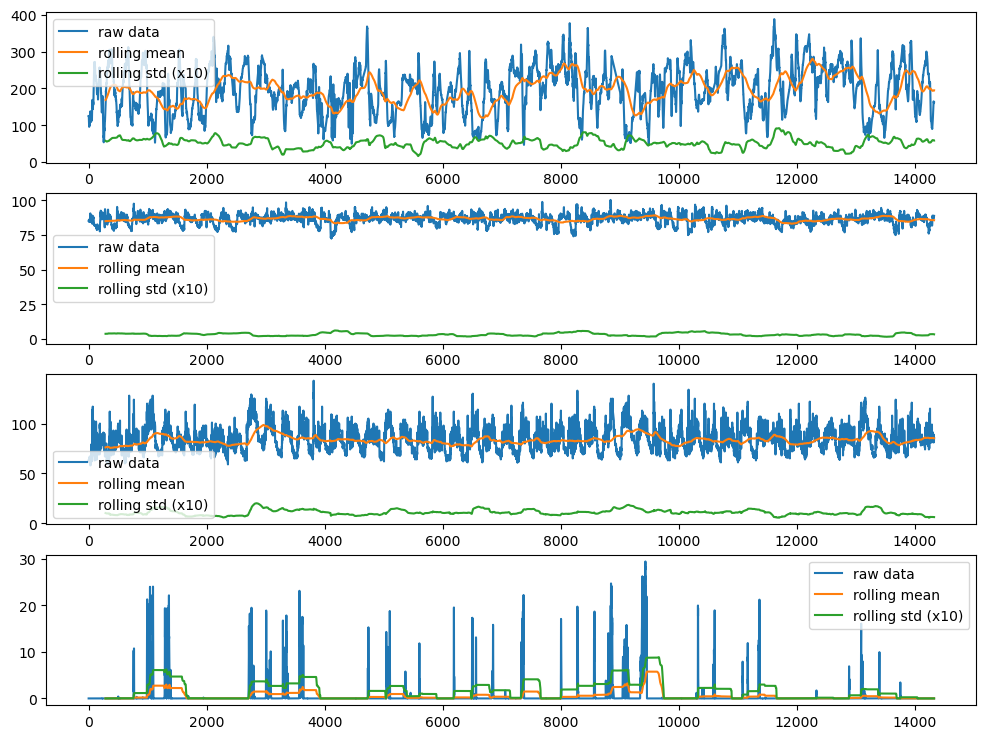

In [27]:
fig, ax = plt.subplots(4, figsize=(12, 9))
for i in range(len(titles)):
    ax[i].plot(data_570.index, data_570[titles[i]], label='raw data')
    ax[i].plot(data_570[titles[i]].rolling(window=288).mean(), label="rolling mean");
    ax[i].plot(data_570[titles[i]].rolling(window=288).std(), label="rolling std (x10)");
    ax[i].legend()

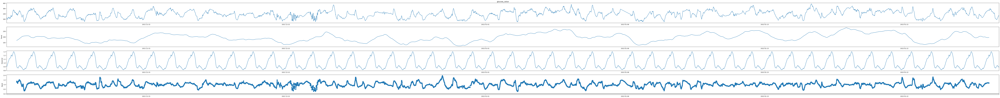

In [183]:
from statsmodels.tsa.seasonal import seasonal_decompose

#stock.set_index('Date', inplace=True)

dates = pd.to_datetime(time, dayfirst=True)
df = data_570.set_index(dates)

# Reproduce the example in OP
#seasonal_decompose(df, model='additive', freq=1).plot()

# period is the number of obeservations in a seasonal cycle
decompose_result_mult = seasonal_decompose(df['glucose_value'], model="multiplicative", period=288)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

fig = decompose_result_mult.plot()
fig.set_size_inches((100, 10))
# Tight layout to realign things
fig.tight_layout()
plt.show()

In [237]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

#df['glucose_triple'] = ExponentialSmoothing(df['glucose_value'], trend='mul',seasonal='mul',seasonal_periods=288).fit(smoothing_level=0.05).fittedvalues
df['glucose_simple'] = SimpleExpSmoothing(df['glucose_value']).fit(smoothing_level=0.3, optimized=False).fittedvalues
df['glucose_simple_2'] = SimpleExpSmoothing(df['glucose_value']).fit(smoothing_level=0.1, optimized=False).fittedvalues
df['heart_simple'] = SimpleExpSmoothing(df['heart_rate_value']).fit(smoothing_level=0.3, optimized=False).fittedvalues
df['heart_simple_2'] = SimpleExpSmoothing(df['heart_rate_value']).fit(smoothing_level=0.1, optimized=False).fittedvalues
df['skin_simple'] = SimpleExpSmoothing(df['skin_temp_value']).fit(smoothing_level=0.3, optimized=False).fittedvalues
df['skin_simple_2'] = SimpleExpSmoothing(df['skin_temp_value']).fit(smoothing_level=0.1, optimized=False).fittedvalues
df['gsr_simple'] = SimpleExpSmoothing(df['gsr_value']).fit(smoothing_level=0.3, optimized=False).fittedvalues
df['gsr_simple_2'] = SimpleExpSmoothing(df['gsr_value']).fit(smoothing_level=0.1, optimized=False).fittedvalues
#df['glucose_holt'] = Holt(df['glucose_value']).fit(smoothing_level=0.1, smoothing_slope=0.01).fittedvalues

C:\Users\wang\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency 5T will be used.
  self._init_dates(dates, freq)
C:\Users\wang\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency 5T will be used.
  self._init_dates(dates, freq)
C:\Users\wang\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency 5T will be used.
  self._init_dates(dates, freq)
C:\Users\wang\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency 5T will be used.
  self._init_dates(dates, freq)
C:\Users\wang\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency 5T will be used.
  self.

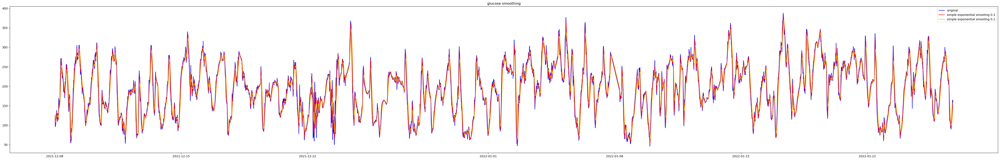

In [248]:
fig = plt.subplots(figsize=(60, 9))

plt.plot(df.index, df['glucose_value'], color='b', label='original')
plt.plot(df.index, df['glucose_simple'], color='red', label='simple exponential smooting 0.3')
plt.plot(df.index, df['glucose_simple_2'], color='orange', label='simple exponential smooting 0.1')
plt.title('glucose smoothing')
#plt.plot(df.index, df['glucose_triple'], color='orange')
#plt.plot(df.index, df['glucose_holt'], color='orange')
plt.legend()

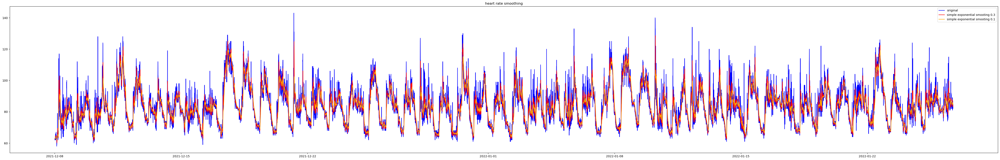

In [249]:
fig = plt.subplots(figsize=(60, 9))

plt.plot(df.index, df['heart_rate_value'], color='b', label='original')
plt.plot(df.index, df['heart_simple'], color='red', label='simple exponential smooting 0.3')
plt.plot(df.index, df['heart_simple_2'], color='orange', label='simple exponential smooting 0.1')
plt.title('heart rate smoothing')
#plt.plot(df.index, df['glucose_triple'], color='orange')
#plt.plot(df.index, df['glucose_holt'], color='orange')
plt.legend()

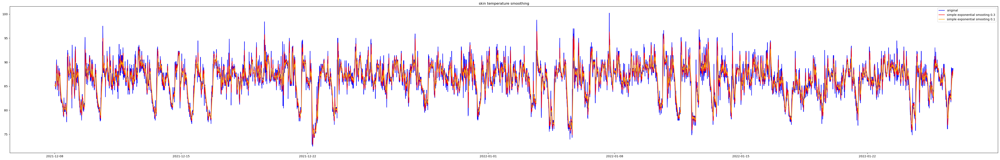

In [250]:
fig = plt.subplots(figsize=(60, 9))

plt.plot(df.index, df['skin_temp_value'], color='b', label='original')
plt.plot(df.index, df['skin_simple'], color='red', label='simple exponential smooting 0.3')
plt.plot(df.index, df['skin_simple_2'], color='orange', label='simple exponential smooting 0.1')
plt.title('skin temperature smoothing')
#plt.plot(df.index, df['glucose_triple'], color='orange')
#plt.plot(df.index, df['glucose_holt'], color='orange')
plt.legend()

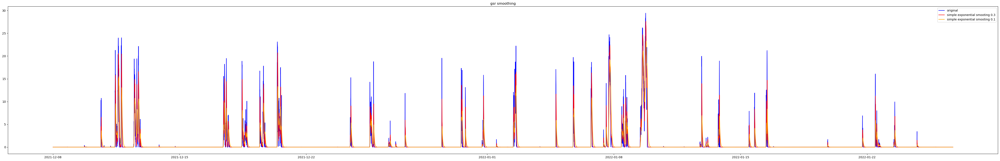

In [251]:
fig = plt.subplots(figsize=(60, 9))

plt.plot(df.index, df['gsr_value'], color='b', label='original')
plt.plot(df.index, df['gsr_simple'], color='red', label='simple exponential smooting 0.3')
plt.plot(df.index, df['gsr_simple_2'], color='orange', label='simple exponential smooting 0.1')
plt.title('gsr smoothing')
#plt.plot(df.index, df['glucose_triple'], color='orange')
#plt.plot(df.index, df['glucose_holt'], color='orange')
plt.legend()

Moving Average

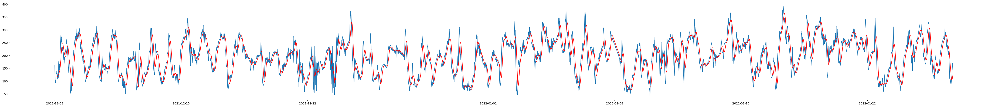

In [117]:
plt.figure(figsize=(60,6))

rolling = df['glucose_value'].rolling(window=36)
rolling_mean = rolling.mean()
#print(rolling_mean.head(10))
# plot original and transformed dataset
plt.plot(df.index, df['glucose_add'])
plt.plot(df.index, rolling_mean, color='red')

In [252]:
df_570_smoothing = pd.DataFrame(list(zip(df['glucose_simple'], df['heart_simple'], df['skin_simple'], df['gsr_simple'], time)), columns=['glucose_value', 'heart_rate_value', 'skin_temp_value', 'gsr_value', 'time'])

In [260]:
df_570_smoothing.to_csv('data/smoothing_570.csv', index=False)

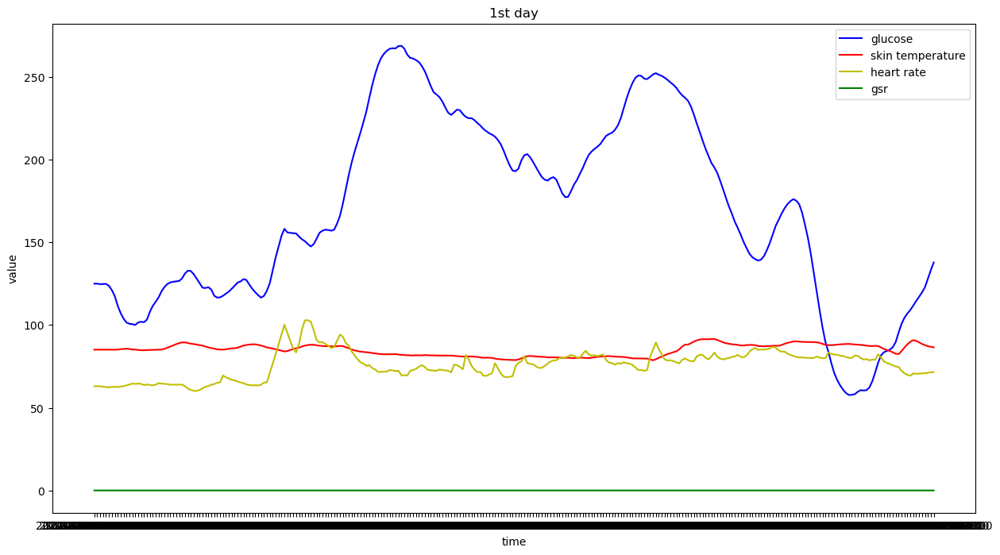

In [261]:
showFeatures(df_570_smoothing[:288], '1st day', 1)

In [214]:
data_570 = pd.read_csv('data/nonmiss_570.csv')

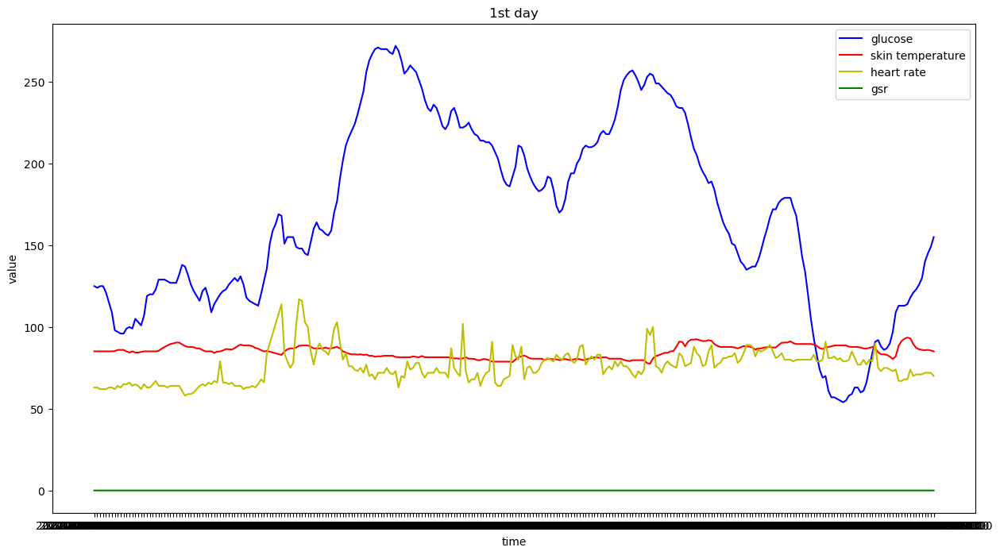

In [259]:
showFeatures(data_570[:288], '1st day', 1)